In [1]:
# Numpy, JAX, Matplotlib and h5py should all be correctly installed and on the python path.
from __future__ import print_function, division, absolute_import
import datetime
import h5py
import jax.numpy as np
from jax import jacrev, random, vmap
from jax.experimental import optimizers
from jax.ops import index, index_add, index_update
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
import numpy as onp             # original CPU-backed NumPy
import os
import sys
import time
import tensorflow as tf
from scipy import stats
from sklearn import linear_model
from numpy import linalg as LA
import numpy.random as npr
from sklearn.decomposition import PCA

import getpass
ui = getpass.getuser()
if ui == 'laura':
    p = '/home/laura'
elif ui == 'lauradriscoll':
    p = '/Users/lauradriscoll/Documents'

In [2]:
sys.path.append(os.path.join(p,'code','computation-thru-dynamics'))
import fixed_point_finder.decision as decision
import fixed_point_finder.fixed_points as fp_optimize
import fixed_point_finder.rnn as rnn
import fixed_point_finder.utils as utils

In [5]:
net = 'stepnet'
rule = 'delayanti'
fp_epoch = 'stim1'
model_n = 0
dir_specific_all = 'crystals/softplus/l2h00001'#'crystals/softplus/l2h00001'#'stepnet/crystals/softplus/'#grad_norm_both/'#'lowD/combos'#'stepnet/lowD/tanh'#'lowD/grad_norm_l2001' #' #'lowD/armnet_noreg'#lowD/combos' ##grad_norm_l2h000001' /Documents/data/rnn/multitask/varGo/lowD/most/
model_dir_all = os.path.join(p,'data/rnn/multitask/',dir_specific_all,str(model_n))

In [6]:
PATH_YANGNET = os.path.join(p,'code/multitask-nets',net)

sys.path.insert(0, PATH_YANGNET)
from task import generate_trials, rule_name, rule_index_map, rules_dict
from network import Model
import tools
from tools_lnd import plot_N, plot_FP, name_best_ckpt, generate_Beta_epoch, make_h_combined, same_stim_trial

In [7]:
ckpt_n = name_best_ckpt(model_dir_all,rule)
ckpt_n_dir = os.path.join(model_dir_all,'ckpts/model.ckpt-' + str(int(ckpt_n)))

model = Model(model_dir_all)
with tf.Session() as sess:
    model.saver.restore(sess,ckpt_n_dir)
    model._sigma=0
    var_list = model.var_list
    params = [sess.run(var) for var in var_list]
    hparams = model.hp
    trial = generate_trials(rule, hparams, mode='test', noise_on=False, batch_size = 128, delay_fac =1)
    feed_dict = tools.gen_feed_dict(model, trial, hparams)
    h_tf, y_hat_tf = sess.run([model.h, model.y_hat], feed_dict=feed_dict) #(n_time, n_condition, n_neuron)
    
    n_input = hparams['n_input']
    n_rnn = hparams['n_rnn']
    n_output = hparams['n_output']
    w_in = params[0]
    b_in = params[1]
    w_out = params[2]
    b_out = params[3]
    sigma_rec = 0#hparams['sigma_rec']
    dt = hparams['dt']
    tau = hparams['tau']
    alpha = dt/tau
    activation = hparams['activation']

#get trial shape
_,B,N = np.shape(h_tf)
trial_set = range(0,B)

# Fixed point epoch
T = trial.epochs[fp_epoch][1]

# Input during fixed point epoch
x_star = trial.x[T-1,0,:]  

# Make a one parameter function of thie hidden state, useful for jacobians.
rnn_fun = lambda h : rnn_vanilla(params, h, x_star, alpha)
batch_rnn_fun = vmap(rnn_fun, in_axes=(0,))

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
Instructions for updating:
Use `tf.global_variables_initializer` instead.
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2h00001/0/ckpts/model.ckpt-1372000


In [8]:
if activation == 'softplus':
    _activation = lambda x: np.log(np.exp(x) + 1)
elif activation == 'tanh':
    _activation = lambda x: np.tanh(x)
elif activation == 'relu':
    _activation = lambda x: x * (x > 0)
elif activation == 'power':
    _activation = lambda x: (x * (x > 0))**2
elif activation == 'retanh':
    _activation = lambda x: np.tanh(x * (x > 0))

def out_affine(params, h):
    return np.dot(params[2].T,h)+params[3]

def relu(x):
    f = x * (x > 0)
    return f

def rnn_vanilla(params, h, x, alpha):
    xh = np.concatenate([x,h], axis=0)
    gate_inputs = np.dot(params[0].T,xh)+params[1]
    noise = 0
    output = _activation(gate_inputs) # + noise

    h_new = (1-alpha) * h + alpha * output
    
    return h_new

batch_affine = vmap(out_affine, in_axes=(None, 0))

def vanilla_run_with_h0(params, x_t, h0, alpha):
    h = h0
    h_t = []
    h_t.append(h)
    for x in x_t:
        h = rnn_vanilla(params, np.squeeze(h), np.squeeze(x.T), alpha)
        h_t.append(np.expand_dims(h,axis=1))

    h_t = np.squeeze(np.array(h_t))  
    o_t = batch_affine(params, h_t)
    return h_t, o_t

def vanilla_run_at_fp(params, x_t, h0, alpha):
    h = h0
    h_t = []
    h_t.append(h)
    for x in x_t:
        h = rnn_vanilla(params, np.squeeze(h), np.squeeze(x.T), alpha)
        h_t.append(np.expand_dims(h,axis=1))
        
    return h_t

In [186]:
model = Model(model_dir_all)
with tf.Session() as sess:

    rule = 'fdanti'
    model.saver.restore(sess,ckpt_n_dir)
    # get all connection weights and biases as tensorflow variables
    var_list = model.var_list
    # evaluate the parameters after training
    params = [sess.run(var) for var in var_list]
    # get hparams
    hparams = model.hp
    trial = generate_trials(rule, hparams, mode = 'test', batch_size = 400, noise_on=True, delay_fac =1)
    feed_dict = tools.gen_feed_dict(model, trial, hparams)
    h_tf = sess.run(model.h, feed_dict=feed_dict) #(n_time, n_trials, n_neuron)
        
Beta_epoch = generate_Beta_epoch(h_tf,trial)
X_pca = Beta_epoch['stim1']

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2h00001/0/ckpts/model.ckpt-1372000


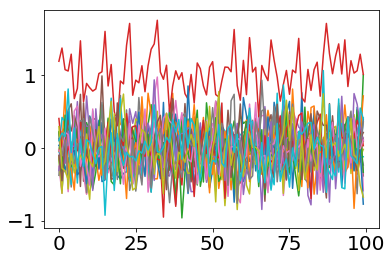

In [188]:
plt.plot(trial.x[:,0,5:])

In [83]:
def plot_FP(X, D, qvals, eig_decomps, cr):
    """Plot activity is some 2D space.

        Args:
            X: Fixed points in #Fps x Neurons
            D: Neurons x 2 plotting dims
    
        """
    log_qvals = np.log10(qvals)

    qmap=plt.get_cmap('gray')
    S = np.shape(X)[0]
    lf = .01
    rf = .05
    
    for s in range(S):
        c = 'k'
        
        X_trial = np.dot(X[s,:],D.T)
        
        n_arg = np.max(onp.argwhere(eig_decomps[s]['evals']>1))+1
        for arg in range(n_arg):
            rdots = np.dot(onp.real(eig_decomps[s]['R'][:, arg]).T,D.T)
            ldots = np.dot(onp.real(eig_decomps[s]['L'][:, arg]).T,D.T)
            overlap = np.dot(rdots,ldots.T)
            r = np.concatenate((X_trial - rf*overlap*rdots, X_trial + rf*overlap*rdots),0)
            plt.plot(r[0:4:2],r[1:4:2],'k',alpha = .5)
        
        n_arg = np.min(onp.argwhere(eig_decomps[s]['evals']<.3))
        for arg in range(n_arg,len(eig_decomps[s]['evals'])):
            rdots = np.dot(onp.real(eig_decomps[s]['R'][:, arg]).T,D.T)
            ldots = np.dot(onp.real(eig_decomps[s]['L'][:, arg]).T,D.T)
            overlap = np.dot(rdots,ldots.T)
            r = np.concatenate((X_trial - rf*overlap*rdots, X_trial + rf*overlap*rdots),0)
            plt.plot(r[0:4:2],r[1:4:2],'b',alpha = .5)
            
        plt.plot(X_trial[0],X_trial[1],'o',c = cr, markersize = 8)
        plt.plot(X_trial[0],X_trial[1],'.',c = 'k', markersize = 10)
        
def eig_decomp(fps):
    sorted_fps = fps
    jacs = fp_optimize.compute_jacobians(rnn_fun, sorted_fps)
    eig_decomps = fp_optimize.compute_eigenvalue_decomposition(jacs, sort_by='real', do_compute_lefts=True)
    
    return sorted_fps, eig_decomps

def make_axes(model_dir_all,ckpt_n_dir,rule_master):

    model = Model(model_dir_all)
    with tf.Session() as sess:

        model.saver.restore(sess,ckpt_n_dir)
        # get all connection weights and biases as tensorflow variables
        var_list = model.var_list
        # evaluate the parameters after training
        params = [sess.run(var) for var in var_list]
        # get hparams
        hparams = model.hp
        trial_master = generate_trials(rule_master, hparams, mode = 'test', batch_size = 400, noise_on=False, delay_fac =1)
        feed_dict = tools.gen_feed_dict(model, trial_master, hparams)
        h_tf = sess.run(model.h, feed_dict=feed_dict) #(n_time, n_trials, n_neuron)

    Beta_epoch = generate_Beta_epoch(h_tf,trial_master)
    X_pca = Beta_epoch['stim1']    
    D = np.concatenate((np.expand_dims(X_pca[:,0],axis=1),np.expand_dims(X_pca[:,1],axis=1)),axis = 1)
    return D

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2h00001/0/ckpts/model.ckpt-1372000
Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2h00001/0/ckpts/model.ckpt-1372000


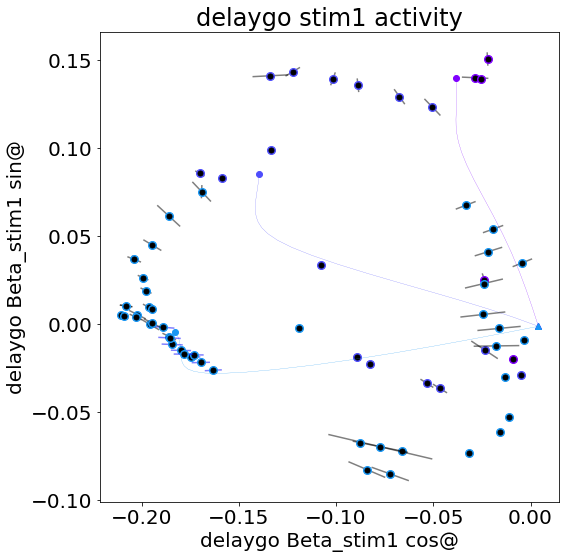

In [38]:
fp_epoch = 'stim1'
tol_ind = 0
tasks = [2]#[0,2,3,5]#range(6)#onp.concatenate(([0,2,3,5],range(11,20)))#range(6)#onp.concatenate((range(6),range(11,20)))

fig = plt.figure(figsize=(15,15),tight_layout=True,facecolor='white')
plt.rcParams.update({'font.size': 20})
cmap=plt.get_cmap('rainbow')
rule_master = 'delaygo'

model = Model(model_dir_all)
with tf.Session() as sess:

    model.saver.restore(sess,ckpt_n_dir)
    # get all connection weights and biases as tensorflow variables
    var_list = model.var_list
    # evaluate the parameters after training
    params = [sess.run(var) for var in var_list]
    # get hparams
    hparams = model.hp
    trial_master = generate_trials(rule_master, hparams, mode = 'test', batch_size = 400, noise_on=False, delay_fac =1)
    feed_dict = tools.gen_feed_dict(model, trial_master, hparams)
    h_tf = sess.run(model.h, feed_dict=feed_dict) #(n_time, n_trials, n_neuron)
        
Beta_epoch = generate_Beta_epoch(h_tf,trial_master)
X_pca = Beta_epoch['stim1']    
D = np.concatenate((np.expand_dims(X_pca[:,0],axis=1),np.expand_dims(X_pca[:,1],axis=1)),axis = 1)
        
## plot w test set of trials
model = Model(model_dir_all)
with tf.Session() as sess:
    model.saver.restore(sess,ckpt_n_dir)
    model._sigma=0
    hparams = model.hp
    
    e_num = 0
    for rule_ind in tasks:
        e_num +=1
        rule = rules_dict['all'][rule_ind]
        trial = generate_trials(rule, hparams, mode='test', noise_on=False, delay_fac =1)
#         trial = same_stim_trial(trial_master, rule_ind)
        feed_dict = tools.gen_feed_dict(model, trial, hparams)
        h_tf, _ = sess.run([model.h, model.y_hat], feed_dict=feed_dict) #(n_time, n_condition, n_neuron)

        T_end = trial.epochs[fp_epoch][1], 
        if T_end[0] is None:
            T_end = np.shape(trial.x)

        T_start = trial.epochs[fp_epoch][0], 
        if T_start[0] is None:
            T_start = (0,)
    
        X = onp.transpose(h_tf[range(T_start[0]-1,T_end[0]),:,:],(1, 0, 2))
        
        fldr = os.path.join(model_dir_all,'fps',rule)
        
        num_trials = np.shape(h_tf)[1]
        plt.subplot(2,2,e_num)
        for s in range(0,10,4):
            filename = fldr +'/'+ fp_epoch + '_' +  str(-9) + '_' + str(s)+'.npz'
            c = cmap(s/num_trials)

            X_trial = np.dot(X[s,:,:],D)
            plt.plot(X_trial[0,0],X_trial[0,1],'^',c = c, linewidth = .3)
            plt.plot(X_trial[:,0],X_trial[:,1],'-',c = c, linewidth = .2)
            if s==0:
                plt.plot(X_trial[-1,0],X_trial[-1,1],'o',c = c, linewidth = .3,label = rule)
            else:
                plt.plot(X_trial[-1,0],X_trial[-1,1],'o',c = c, linewidth = .3)

            if os.path.exists(filename):
                load_all_fps = np.load(filename)
                sorted_fps, eig_decomps = eig_decomp(load_all_fps['fps'])
                plot_FP(sorted_fps, D.T, load_all_fps['losses'], eig_decomps, c)

        plt.xlabel(rule_master + ' Beta_' + fp_epoch + ' cos@')
        plt.ylabel(rule_master + ' Beta_' + fp_epoch + ' sin@') 
        plt.title(rule + ' ' + fp_epoch+' activity')
# plt.axis('equal')  
plt.show()


In [39]:
load_all_fps['losses']

array([1.4538553e-14, 1.7209022e-10, 1.9149568e-10, 2.0720385e-10,
       2.3588662e-10, 2.3966437e-10, 2.8266328e-10, 2.9420749e-10,
       3.1499328e-10, 3.3558178e-10, 3.4044204e-10, 3.4671754e-10,
       3.5248776e-10, 3.6214393e-10, 3.6839293e-10, 3.8782044e-10,
       4.0763448e-10, 4.2604750e-10, 4.3240816e-10, 4.9032928e-10,
       4.9485732e-10, 4.9843563e-10, 5.3328975e-10, 5.5047966e-10,
       5.6632160e-10, 6.2230804e-10, 6.6499806e-10, 6.6520556e-10,
       6.6658568e-10, 6.7514339e-10, 6.7562100e-10, 6.8283906e-10,
       6.8614958e-10, 6.9256417e-10, 6.9658279e-10, 7.0175754e-10,
       7.8628287e-10, 8.1118873e-10, 8.1411033e-10, 8.3445528e-10,
       8.3653734e-10, 8.5381097e-10, 9.3713037e-10, 9.5950237e-10],
      dtype=float32)

In [43]:
np.shape(np.dot(sorted_fps[0].T,D))

(2,)

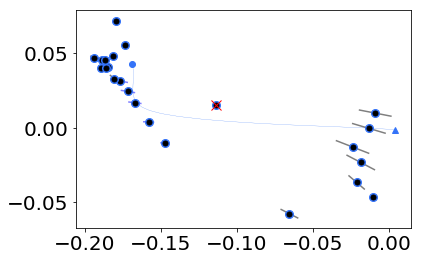

In [45]:
s = 6
ut = -9
cmap=plt.get_cmap('rainbow')

fldr = os.path.join(model_dir_all,'fps',rule)
filename = fldr +'/'+ fp_epoch + '_' +  str(ut) + '_' + str(s)+'.npz'
c = cmap(s/40)

X_trial = np.dot(X[s,:,:],D)
plt.plot(X_trial[0,0],X_trial[0,1],'^',c = c, linewidth = .3)
plt.plot(X_trial[:,0],X_trial[:,1],'-',c = c, linewidth = .2)
if s==0:
    plt.plot(X_trial[-1,0],X_trial[-1,1],'o',c = c, linewidth = .3,label = rule)
else:
    plt.plot(X_trial[-1,0],X_trial[-1,1],'o',c = c, linewidth = .3)

if os.path.exists(filename):
    load_all_fps = np.load(filename)
    sorted_fps, eig_decomps = eig_decomp(load_all_fps['fps'])
    plot_FP(sorted_fps, D.T, load_all_fps['losses'], eig_decomps, c)
    X_fp = np.dot(sorted_fps[0].T,D)
    plt.plot(X_fp[0],X_fp[1],'xr',markersize = 10)

In [61]:
x_star = load_all_fps['input']
rnn_fun = lambda h : rnn_vanilla(params, h, x_star, alpha)
batch_rnn_fun = vmap(rnn_fun, in_axes=(0,))
loss_fun = lambda h : np.mean((h - batch_rnn_fun(h))**2, axis=1)

In [47]:
loss_fun(load_all_fps['fps'])

DeviceArray([3.65290480e-14, 1.27484169e-11, 1.70434153e-11,
             2.54826993e-11, 7.57166829e-11, 7.96344726e-11,
             1.13327916e-10, 1.30628036e-10, 1.34793732e-10,
             1.47348439e-10, 1.69166403e-10, 2.13651763e-10,
             2.87654345e-10, 3.20198562e-10, 3.33519740e-10,
             3.47719020e-10, 4.46804732e-10, 5.18624699e-10,
             5.80494763e-10, 6.31472596e-10, 6.36922404e-10,
             9.30743593e-10, 9.99741401e-10], dtype=float32)

In [48]:
load_all_fps['losses']

array([3.66404024e-14, 1.27463925e-11, 1.70440259e-11, 2.54845693e-11,
       7.57161556e-11, 7.96372829e-11, 1.13330123e-10, 1.30633587e-10,
       1.34797937e-10, 1.47339252e-10, 1.69163530e-10, 2.13649237e-10,
       2.87644020e-10, 3.20188209e-10, 3.33511802e-10, 3.47695761e-10,
       4.46782472e-10, 5.18618537e-10, 5.80505755e-10, 6.31478814e-10,
       6.36938724e-10, 9.30729105e-10, 9.99727412e-10], dtype=float32)

In [49]:
np.mean((load_all_fps['fps'][0] - rnn_fun(load_all_fps['fps'][0]))**2)

DeviceArray(3.6561777e-14, dtype=float32)

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2h00001/0/ckpts/model.ckpt-1372000


In [102]:
np.shape([])[0]

0

In [179]:
def plot_fp_jitter(model_dir_all,rule,s,ut,D,vanilla_run_at_fp,n_steps = 100,rand_step_coef=.005,n_bumps = 10,h_tf = [],trial = [],c = []):

    if np.shape(h_tf)[0]==0:
        model = Model(model_dir_all)
        with tf.Session() as sess:
            model.saver.restore(sess,ckpt_n_dir)
            model._sigma=0
            hparams = model.hp
            trial = generate_trials(rule, hparams, mode='test', noise_on=False, delay_fac =1)
            feed_dict = tools.gen_feed_dict(model, trial, hparams)
            h_tf = sess.run(model.h, feed_dict=feed_dict) #(n_time, n_condition, n_neuron)
    
    if np.shape(c)[0]==0:
        c = cmap(s/np.shape(h_tf)[1])
        
    fldr = os.path.join(model_dir_all,'fps',rule)
    filename = fldr +'/'+ fp_epoch + '_' +  str(ut) + '_' + str(s)+'.npz'

    if os.path.exists(filename):
        load_all_fps = np.load(filename)

        x_star = load_all_fps['input']
        x_long = onp.matlib.repmat(x_star,n_steps,1)

        for nfp in range(np.shape(load_all_fps['fps'])[0]):
            h0 = np.squeeze(load_all_fps['fps'][nfp,:])

            for bump_num in range(n_bumps):
                h = h0 + rand_step_coef*npr.randn(N)
                h_t = vanilla_run_at_fp(params, x_long, h, alpha)

                X_trial = onp.dot(h_t,D)
                plt.plot(X_trial[:,0],X_trial[:,1],'-',c = c, linewidth = 1,alpha = .2)
                plt.plot(X_trial[-1,0],X_trial[-1,1],'^',c = c, linewidth = 1,alpha = .2)

            X_trial = onp.dot(h0.T,D)
            plt.plot(X_trial[0],X_trial[1],'o',c = c, linewidth = 2)
            plt.plot(X_trial[0],X_trial[1],'.k', linewidth = 2)

        h_tf_trial = onp.dot(h_tf[trial.epochs[fp_epoch][0]:trial.epochs[fp_epoch][1],s,:],D)
        plt.plot(h_tf_trial[:,0],h_tf_trial[:,1],'-',c = c, linewidth = 4)
        plt.plot(h_tf_trial[:,0],h_tf_trial[:,1],'-k', linewidth = 1)
        plt.plot(h_tf_trial[-1,0],h_tf_trial[-1,1],'^',c = c, markersize = 10)
        plt.ylim(-.25,.25)
        plt.xlim(-.25,.25)
    
def plot_1fp_jitter(model_dir_all,rule,s,ut,D,vanilla_run_at_fp,n_steps = 100,rand_step_coef=.001,n_bumps = 10):

    c = cmap(s/40)
    fldr = os.path.join(model_dir_all,'fps',rule)
    filename = fldr +'/'+ fp_epoch + '_' +  str(ut) + '_' + str(s)+'.npz'

    if os.path.exists(filename):
        load_all_fps = np.load(filename)
        
        sorted_fps, eig_decomps = eig_decomp(load_all_fps['fps'])

        x_star = load_all_fps['input']
        rnn_fun = lambda h : rnn_vanilla(params, h, x_star, alpha)
        loss_fun = lambda h : np.mean((h - rnn_fun(h))**2)

        x_long = onp.matlib.repmat(x_star,n_steps,1)

        
        for nfp in range(np.shape(load_all_fps['fps'])[0]):
            h0 = np.squeeze(load_all_fps['fps'][nfp,:])

            fig = plt.figure(figsize=(10,5),tight_layout=True,facecolor='white')
            plt.subplot(1,2,1)
            for bump_num in range(n_bumps):
                h = h0 + rand_step_coef*npr.randn(N)
                h_t = vanilla_run_at_fp(params, x_long, h, alpha)

                X_trial = onp.dot(h_t,D)
                plt.plot(X_trial[:,0],X_trial[:,1],'-',c = c, linewidth = 1,alpha = .2)
                plt.plot(X_trial[0,0],X_trial[0,1],'^',c = c, linewidth = 1,alpha = .2)
                plt.plot(X_trial[-1,0],X_trial[-1,1],'o',c = c, linewidth = 1,alpha = .2)

            X_trial = onp.dot(h0.T,D)
            plt.plot(X_trial[0],X_trial[1],'o',c = c, linewidth = 2)
            plt.plot(X_trial[0],X_trial[1],'.k', linewidth = 2)
            plt.title('loss : ' +str(load_all_fps['losses'][nfp]))
            
            plt.subplot(1,2,2)
            plt.plot(eig_decomps[nfp]['evals'].real,eig_decomps[nfp]['evals'].imag,'.k')
            plt.title('max eigenval : ' +str(np.max(eig_decomps[nfp]['evals'].real)))
            
            print(loss_fun(h0))
            
            plt.show()

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2h00001/0/ckpts/model.ckpt-1372000
Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2h00001/0/ckpts/model.ckpt-1372000
Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=flo

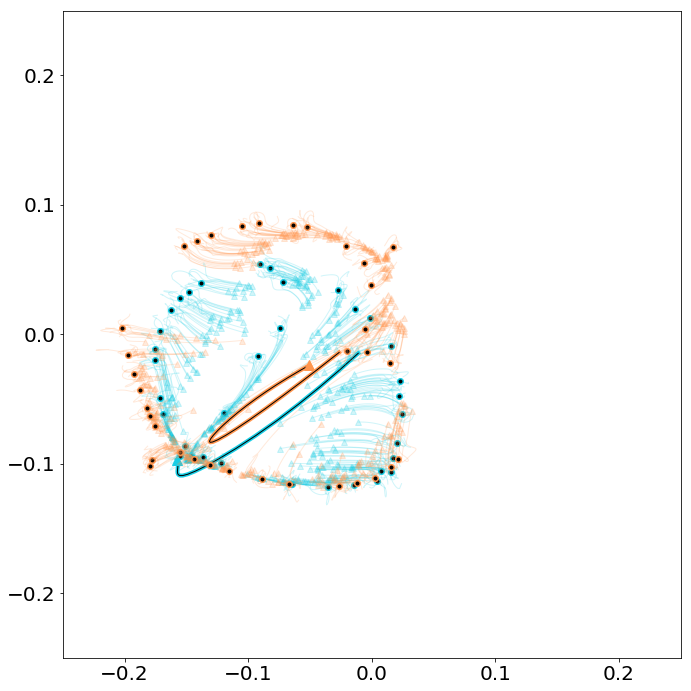

In [147]:
s = 12
ut = -9
cmap=plt.get_cmap('rainbow')

D_go = make_axes(model_dir_all,ckpt_n_dir,'delaygo')
fig = plt.figure(figsize=(10,10),tight_layout=True,facecolor='white')
plot_fp_jitter(model_dir_all,'delaygo',s,ut,D_go,vanilla_run_at_fp,c = cmap(s/40))
plot_fp_jitter(model_dir_all,'delayanti',s,ut,D_go,vanilla_run_at_fp,c = cmap((20+s)/40))

s = 16
plot_fp_jitter(model_dir_all,'delaygo',s,ut,D_go,vanilla_run_at_fp,c = cmap(s/40))
plot_fp_jitter(model_dir_all,'delayanti',s,ut,D_go,vanilla_run_at_fp,c = cmap((20+s)/40))

plt.show()

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2h00001/0/ckpts/model.ckpt-1372000
Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2h00001/0/ckpts/model.ckpt-1372000
Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=flo

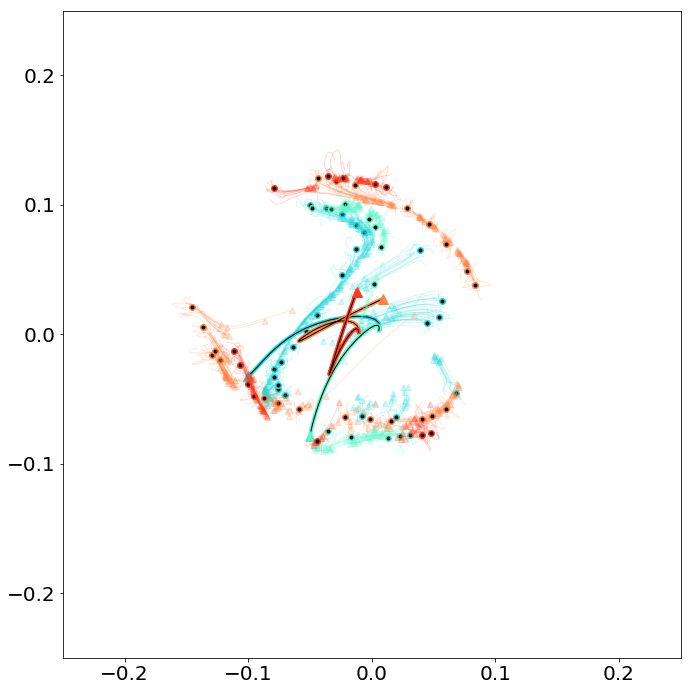

In [151]:
cmap=plt.get_cmap('rainbow')
ut = -9

D_go = make_axes(model_dir_all,ckpt_n_dir,'delaygo')
fig = plt.figure(figsize=(10,10),tight_layout=True,facecolor='white')

for s in [13, 17]:
    plot_fp_jitter(model_dir_all,'delaygo',s,ut,D_go,vanilla_run_at_fp,c = cmap(s/40))
    plot_fp_jitter(model_dir_all,'delayanti',s,ut,D_go,vanilla_run_at_fp,c = cmap((20+s)/40))

plt.show()

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2h00001/0/ckpts/model.ckpt-1372000
Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2h00001/0/ckpts/model.ckpt-1372000
Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=flo

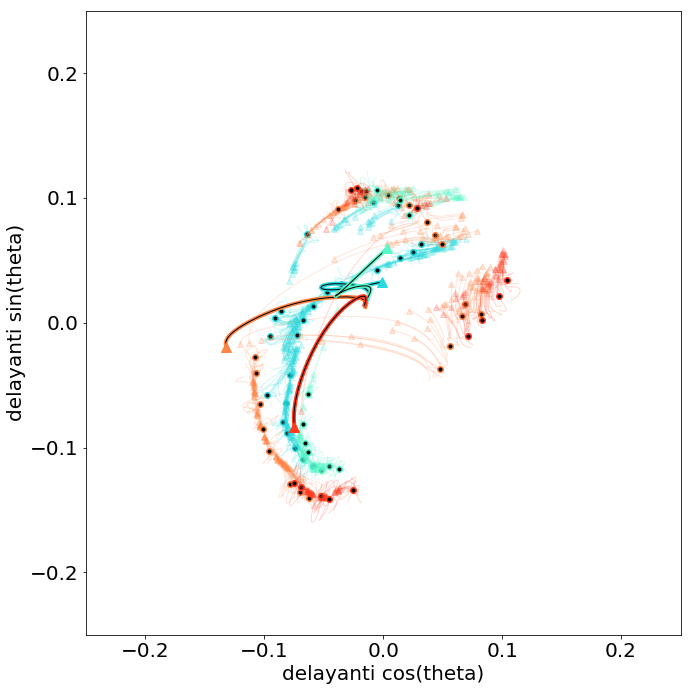

In [162]:
cmap=plt.get_cmap('rainbow')
ut = -9
axis_rule = 'delayanti'

D = make_axes(model_dir_all,ckpt_n_dir,axis_rule)
fig = plt.figure(figsize=(10,10),tight_layout=True,facecolor='white')

for s in [13, 17]:
    plot_fp_jitter(model_dir_all,'delaygo',s,ut,D,vanilla_run_at_fp,c = cmap(s/40))
    plot_fp_jitter(model_dir_all,'delayanti',s,ut,D,vanilla_run_at_fp,c = cmap((20+s)/40))
    
plt.ylabel(axis_rule + ' sin(theta)')
plt.xlabel(axis_rule + ' cos(theta)')
plt.show()

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2h00001/0/ckpts/model.ckpt-1372000
Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2h00001/0/ckpts/model.ckpt-1372000
Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=flo

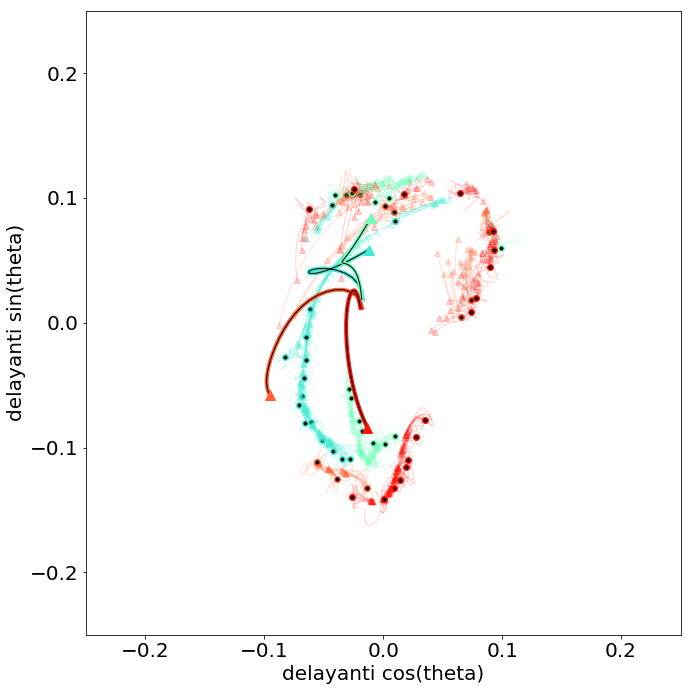

In [163]:
cmap=plt.get_cmap('rainbow')
ut = -9
axis_rule = 'delayanti'

D = make_axes(model_dir_all,ckpt_n_dir,axis_rule)
fig = plt.figure(figsize=(10,10),tight_layout=True,facecolor='white')

for s in [15, 19]:
    plot_fp_jitter(model_dir_all,'delaygo',s,ut,D,vanilla_run_at_fp,c = cmap(s/40))
    plot_fp_jitter(model_dir_all,'delayanti',s,ut,D,vanilla_run_at_fp,c = cmap((20+s)/40))
    
plt.ylabel(axis_rule + ' sin(theta)')
plt.xlabel(axis_rule + ' cos(theta)')
plt.show()

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2h00001/0/ckpts/model.ckpt-1372000
Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2h00001/0/ckpts/model.ckpt-1372000
Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=flo

KeyError: 'input is not a file in the archive'

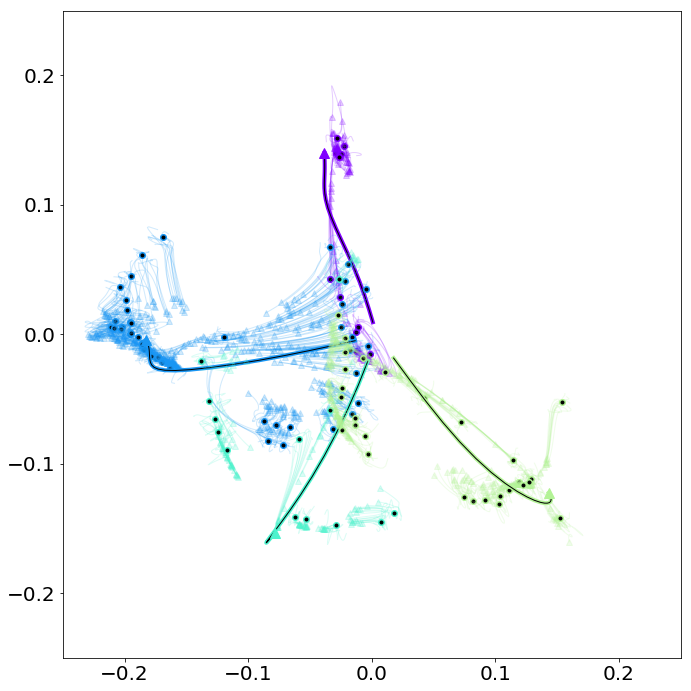

In [169]:
cmap=plt.get_cmap('rainbow')
ut = -9
axis_rule = 'delaygo'

D = make_axes(model_dir_all,ckpt_n_dir,axis_rule)
fig = plt.figure(figsize=(10,10),tight_layout=True,facecolor='white')

for s in range(0,40,8):
    plot_fp_jitter(model_dir_all,axis_rule,s,ut,D,vanilla_run_at_fp,c = cmap(s/40))
    
plt.ylabel(axis_rule + ' sin(theta)')
plt.xlabel(axis_rule + ' cos(theta)')
plt.show()

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2h00001/0/ckpts/model.ckpt-1372000
Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2h00001/0/ckpts/model.ckpt-1372000
Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=flo

KeyError: 'input is not a file in the archive'

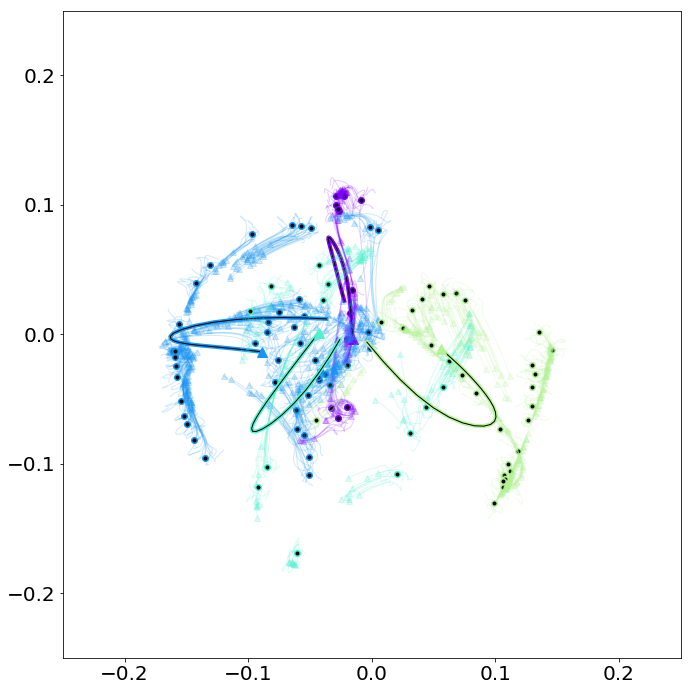

In [171]:
cmap=plt.get_cmap('rainbow')
ut = -9
axis_rule = 'delayanti'

D = make_axes(model_dir_all,ckpt_n_dir,axis_rule)
fig = plt.figure(figsize=(10,10),tight_layout=True,facecolor='white')

for s in range(0,40,8):
    plot_fp_jitter(model_dir_all,'delaygo',s,ut,D,vanilla_run_at_fp,c = cmap(s/40))
    
plt.ylabel(axis_rule + ' sin(theta)')
plt.xlabel(axis_rule + ' cos(theta)')
plt.show()

In [173]:
np.shape(D)

(256, 2)

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2h00001/0/ckpts/model.ckpt-1372000
Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2h00001/0/ckpts/model.ckpt-1372000
Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=flo

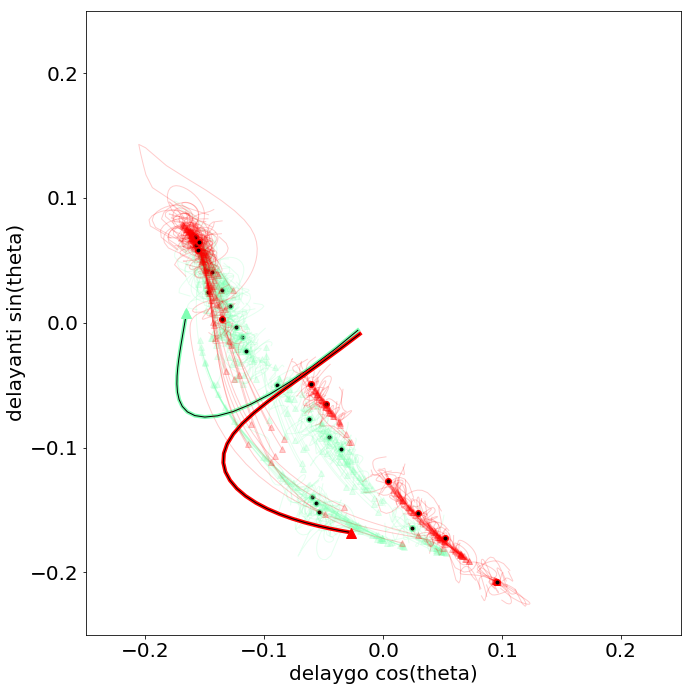

In [180]:
cmap=plt.get_cmap('rainbow')
ut = -9
axis_rule = 'delaygo'

D_go = make_axes(model_dir_all,ckpt_n_dir,'delaygo')
D_anti = make_axes(model_dir_all,ckpt_n_dir,'delayanti')
D = np.concatenate((D_go[:,1:],D_anti[:,1:]),axis=1)
D, _ = LA.qr(D)
fig = plt.figure(figsize=(10,10),tight_layout=True,facecolor='white')

for s in range(20,21):
    plot_fp_jitter(model_dir_all,'delaygo',s,ut,D,vanilla_run_at_fp,rand_step_coef=.01,n_bumps = 20,c = cmap(s/40))
    plot_fp_jitter(model_dir_all,'delayanti',s,ut,D,vanilla_run_at_fp,rand_step_coef=.01,n_bumps = 20,c = cmap((s+20)/40))
    
plt.ylabel('delayanti' + ' sin(theta)')
plt.xlabel('delaygo' + ' cos(theta)')
plt.show()

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2h00001/0/ckpts/model.ckpt-1372000
Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2h00001/0/ckpts/model.ckpt-1372000
Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=flo

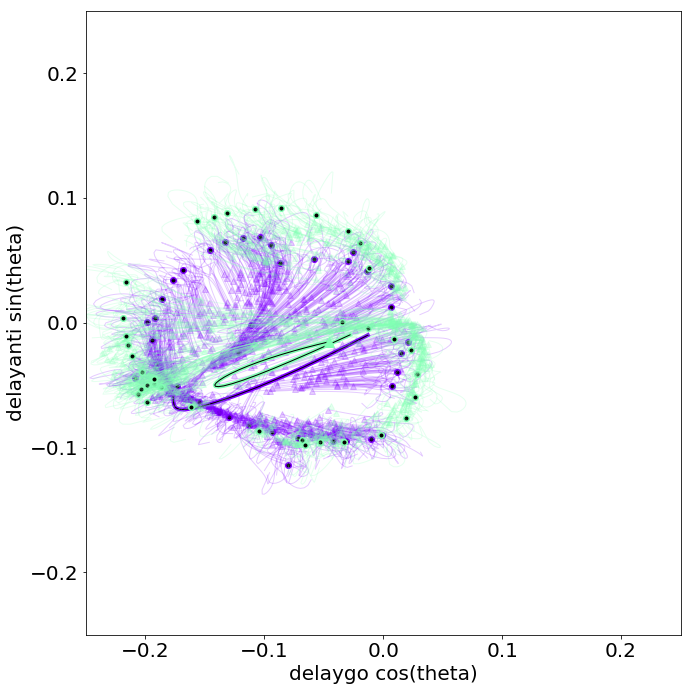

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2h00001/0/ckpts/model.ckpt-1372000


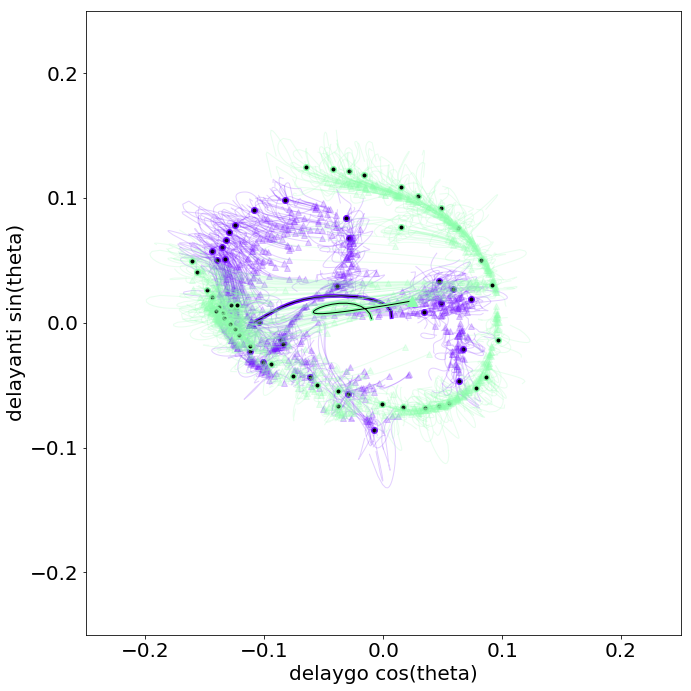

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2h00001/0/ckpts/model.ckpt-1372000


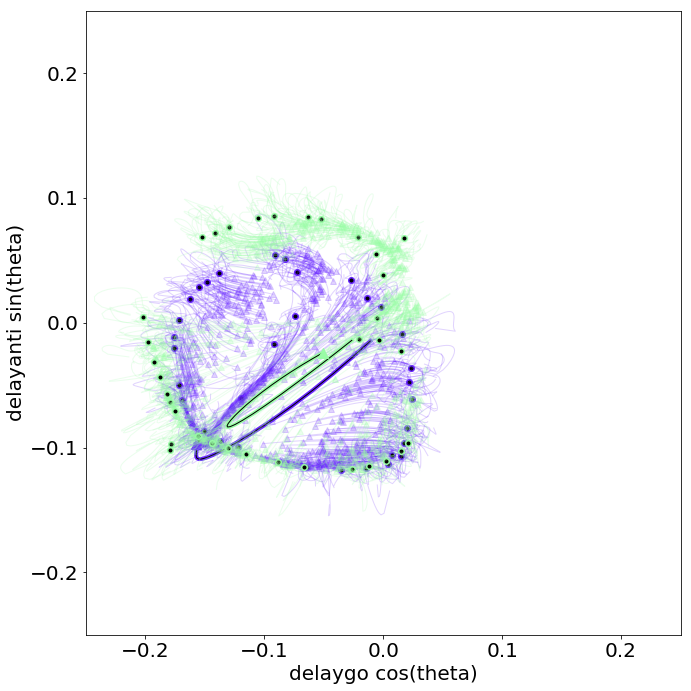

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2h00001/0/ckpts/model.ckpt-1372000


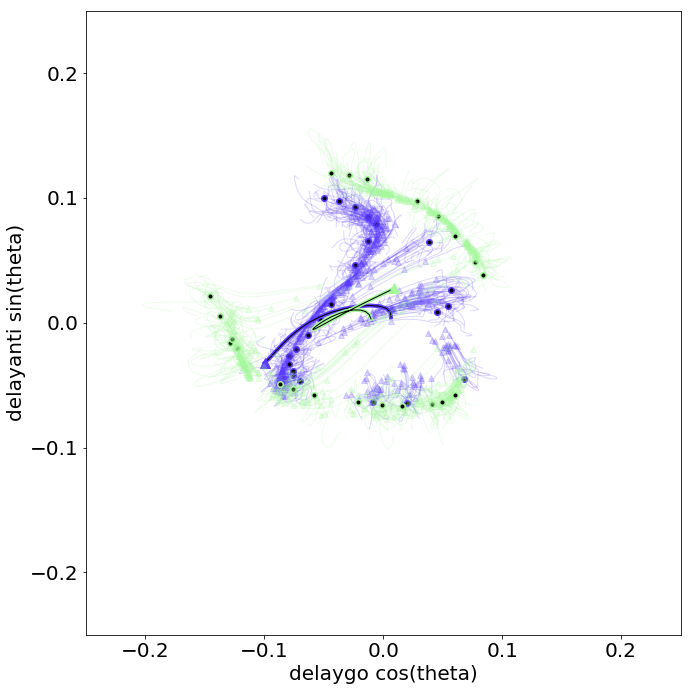

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2h00001/0/ckpts/model.ckpt-1372000


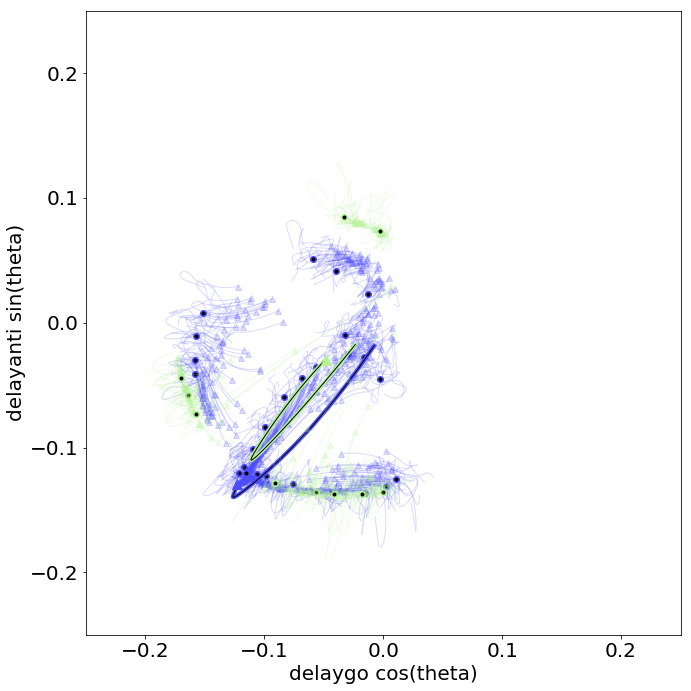

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2h00001/0/ckpts/model.ckpt-1372000


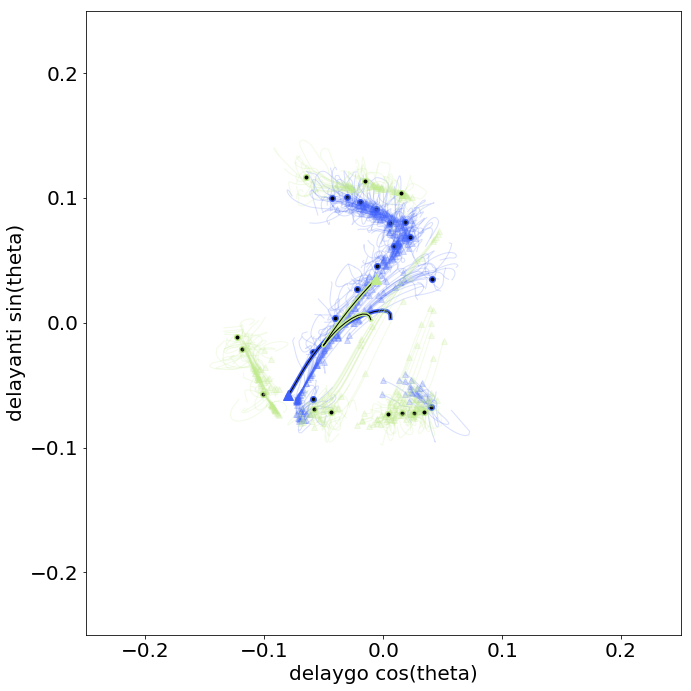

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2h00001/0/ckpts/model.ckpt-1372000


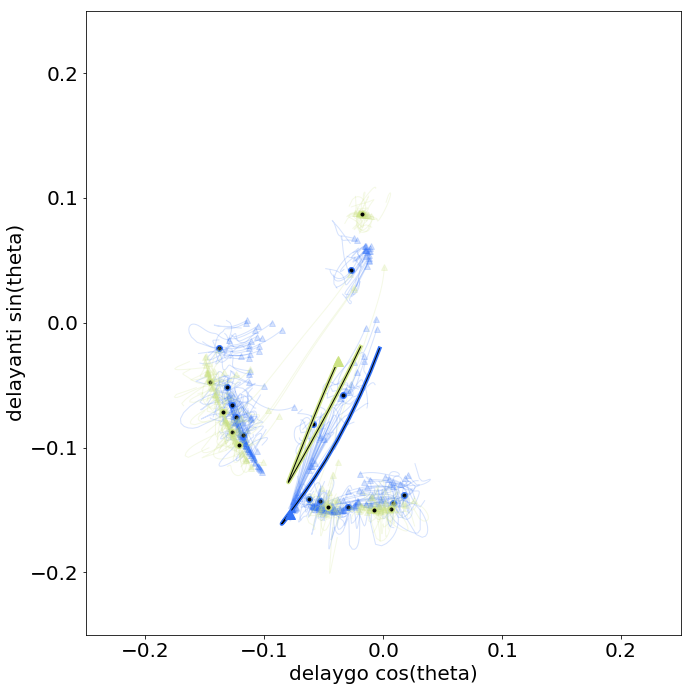

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2h00001/0/ckpts/model.ckpt-1372000


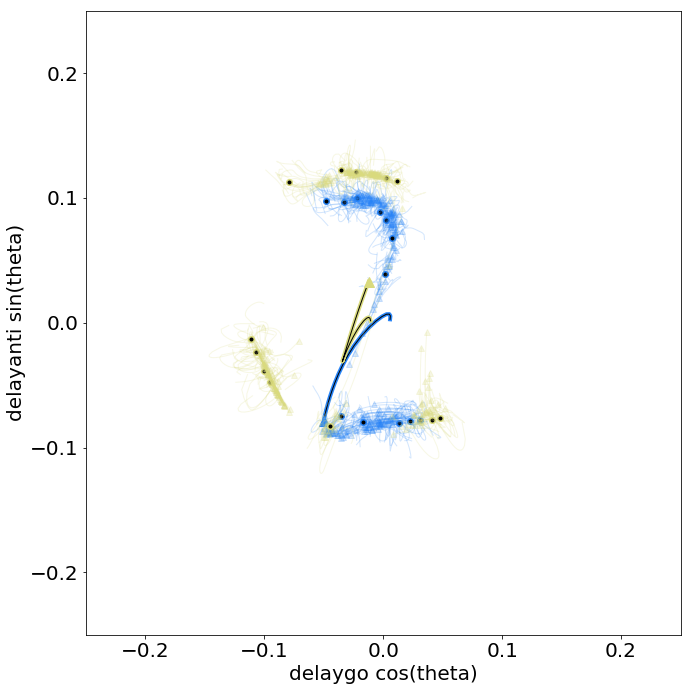

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2h00001/0/ckpts/model.ckpt-1372000


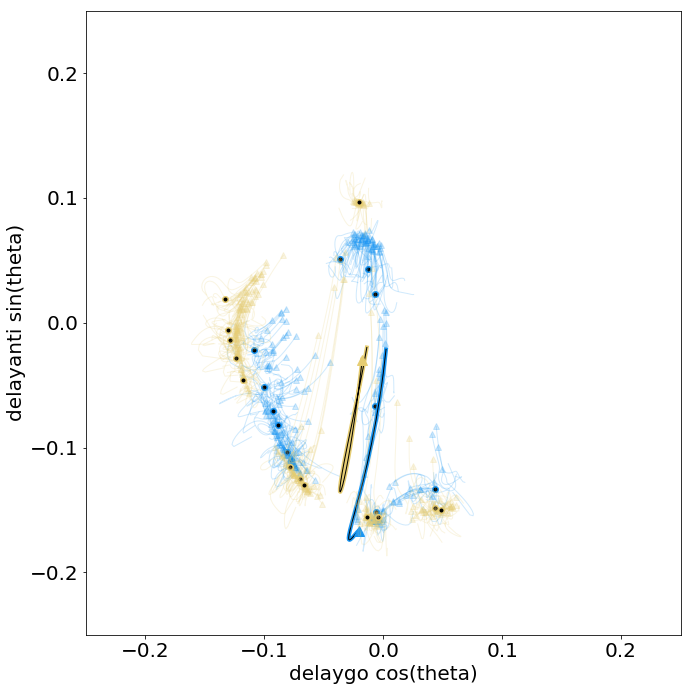

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2h00001/0/ckpts/model.ckpt-1372000


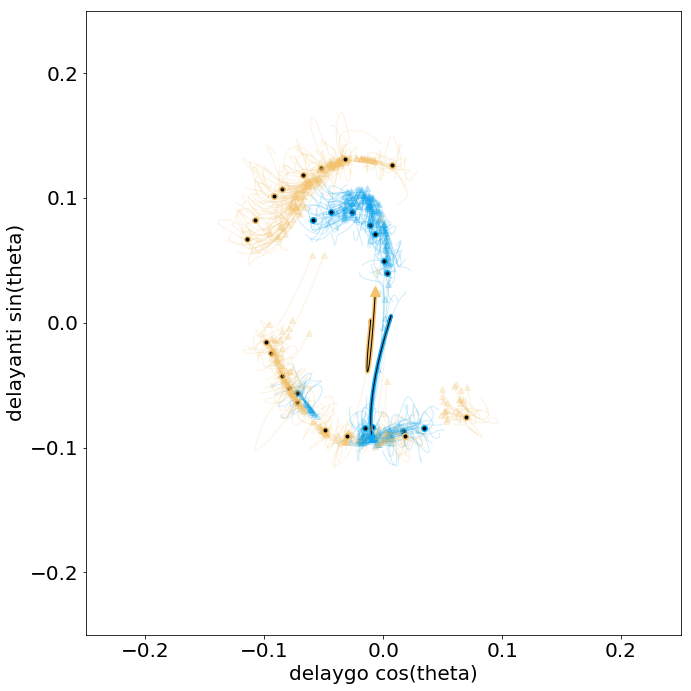

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2h00001/0/ckpts/model.ckpt-1372000


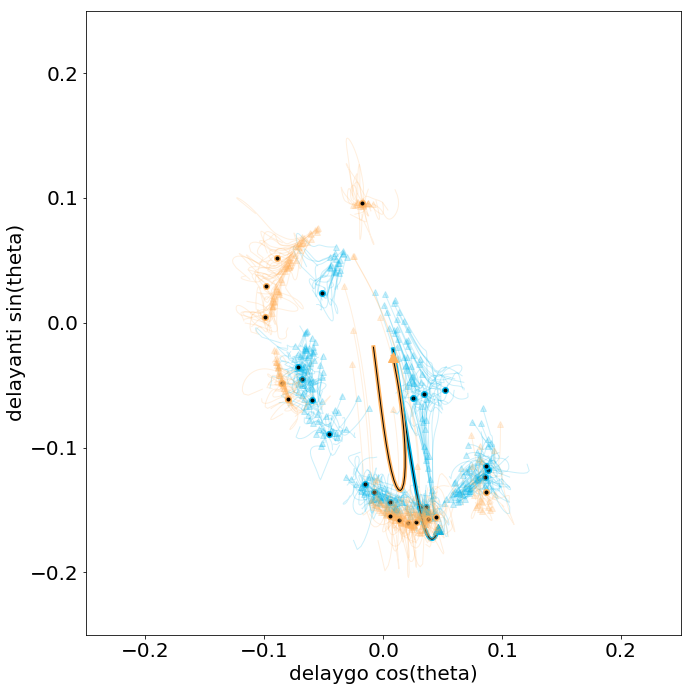

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2h00001/0/ckpts/model.ckpt-1372000


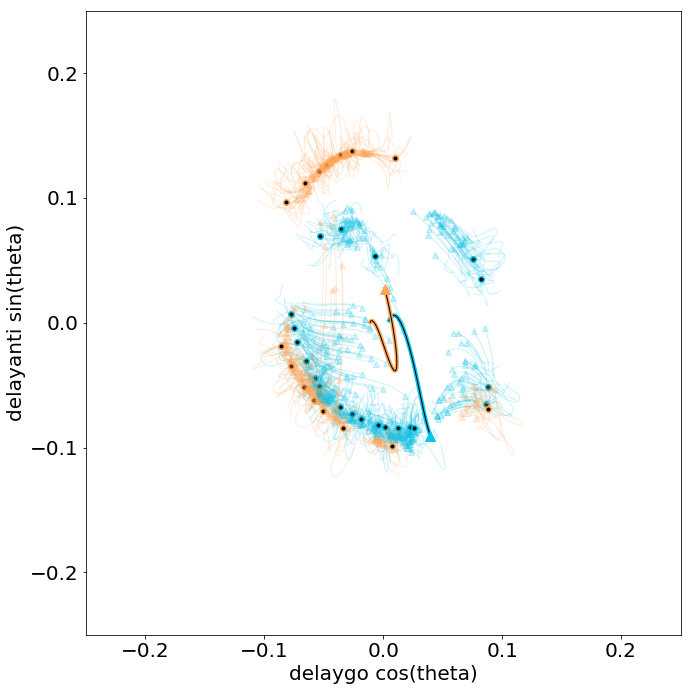

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2h00001/0/ckpts/model.ckpt-1372000


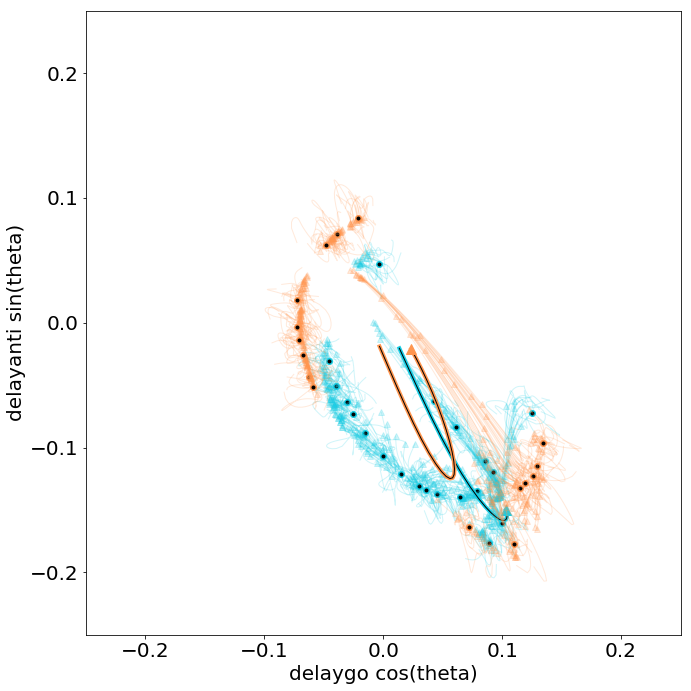

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2h00001/0/ckpts/model.ckpt-1372000


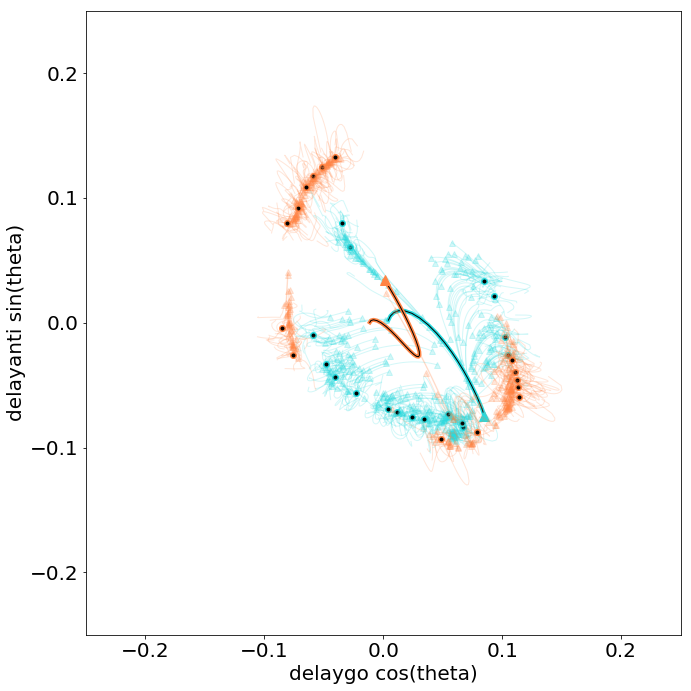

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2h00001/0/ckpts/model.ckpt-1372000


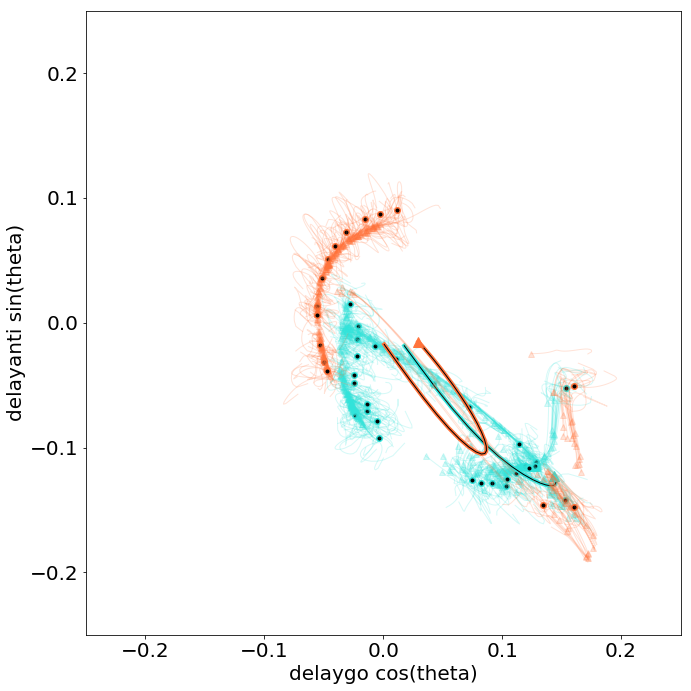

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2h00001/0/ckpts/model.ckpt-1372000


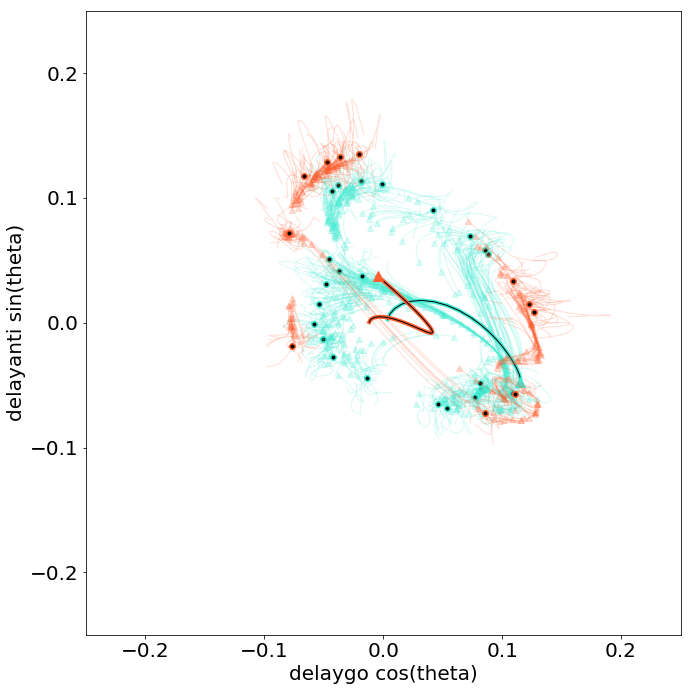

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2h00001/0/ckpts/model.ckpt-1372000


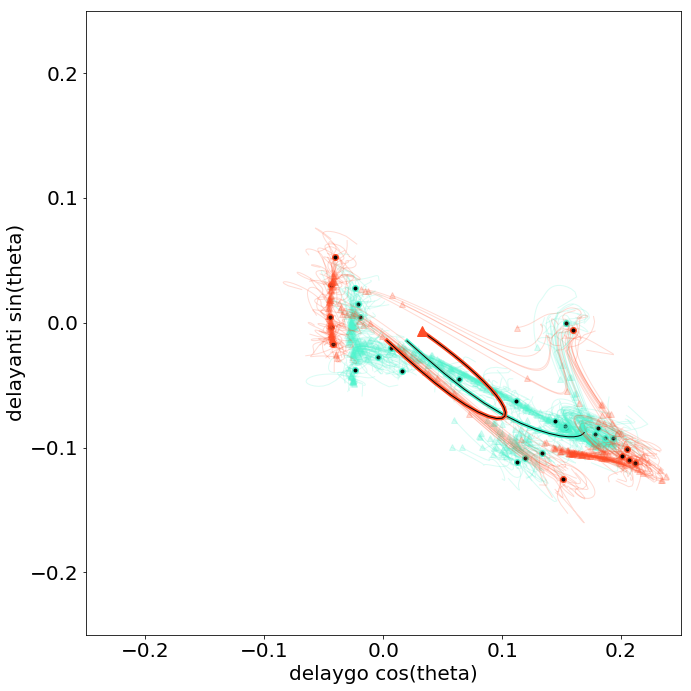

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2h00001/0/ckpts/model.ckpt-1372000


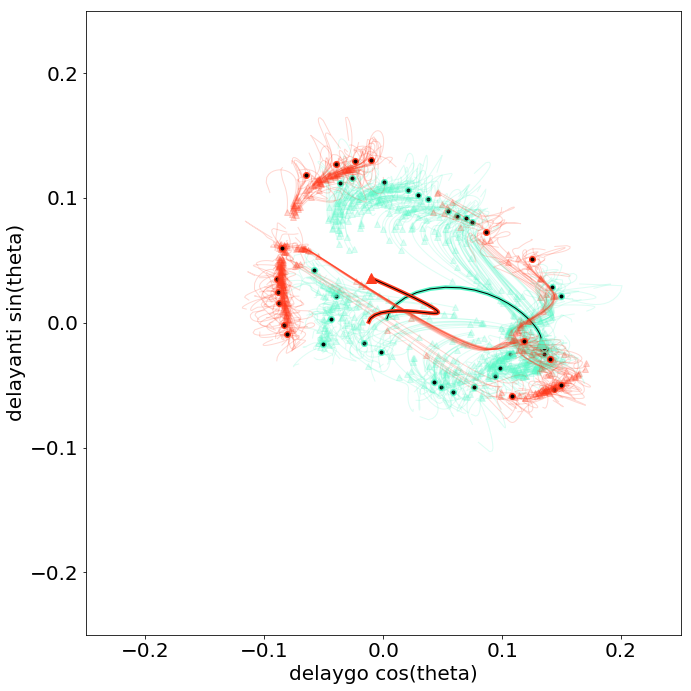

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2h00001/0/ckpts/model.ckpt-1372000


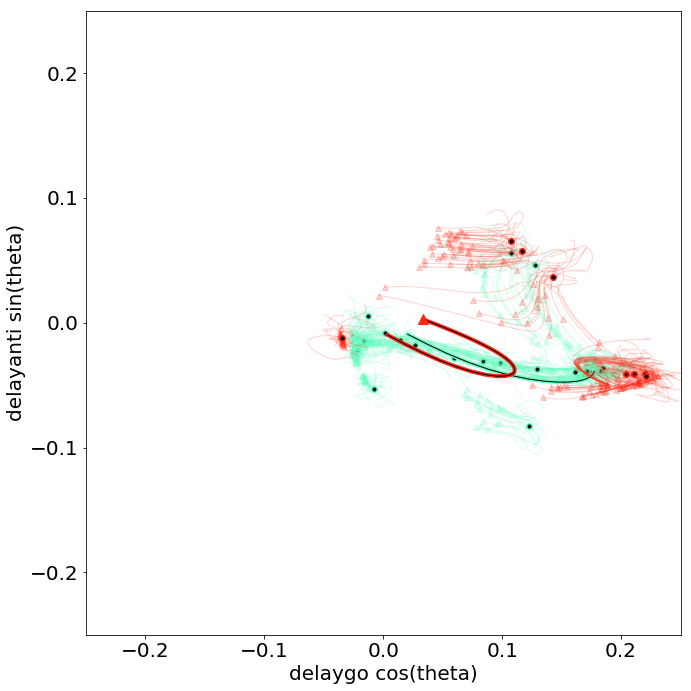

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2h00001/0/ckpts/model.ckpt-1372000


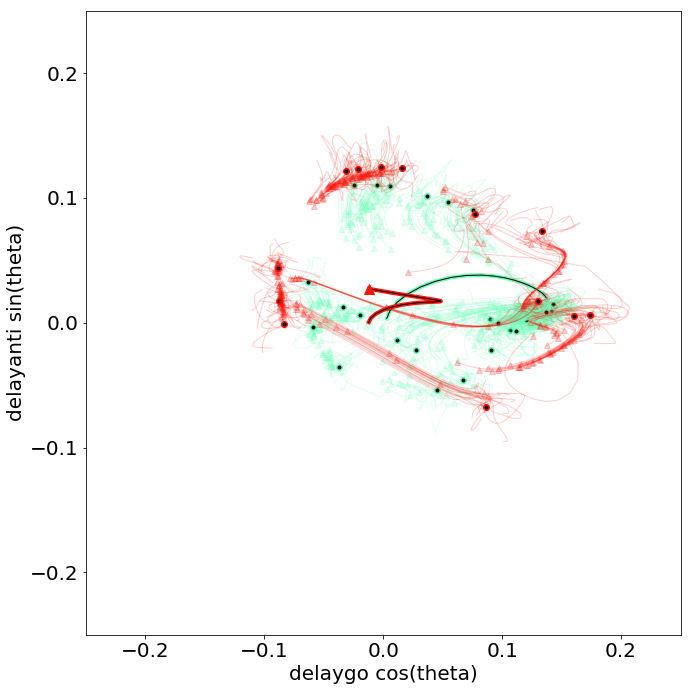

In [185]:
cmap=plt.get_cmap('rainbow')
ut = -9
axis_rule = 'delaygo'

D = make_axes(model_dir_all,ckpt_n_dir,axis_rule)
model = Model(model_dir_all)
with tf.Session() as sess:
    model.saver.restore(sess,ckpt_n_dir)
    model._sigma=0
    hparams = model.hp
    trial = generate_trials(axis_rule, hparams, mode='test', noise_on=False, delay_fac =1)
    feed_dict = tools.gen_feed_dict(model, trial, hparams)
    h_tf = sess.run(model.h, feed_dict=feed_dict) #(n_time, n_condition, n_neuron)

for s in range(10,30):
    fig = plt.figure(figsize=(10,10),tight_layout=True,facecolor='white')
    plot_fp_jitter(model_dir_all,'delaygo',s,ut,D,vanilla_run_at_fp,c=cmap((s-10)/40),rand_step_coef=.01,n_bumps = 20, h_tf = h_tf, trial = trial)
    plot_fp_jitter(model_dir_all,'delayanti',s,ut,D,vanilla_run_at_fp,c=cmap((s+10)/40),rand_step_coef=.01,n_bumps = 20)
    
    plt.ylabel('delayanti' + ' sin(theta)')
    plt.xlabel('delaygo' + ' cos(theta)')
    plt.show()

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2h00001/0/ckpts/model.ckpt-1372000
Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2h00001/0/ckpts/model.ckpt-1372000
Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=flo

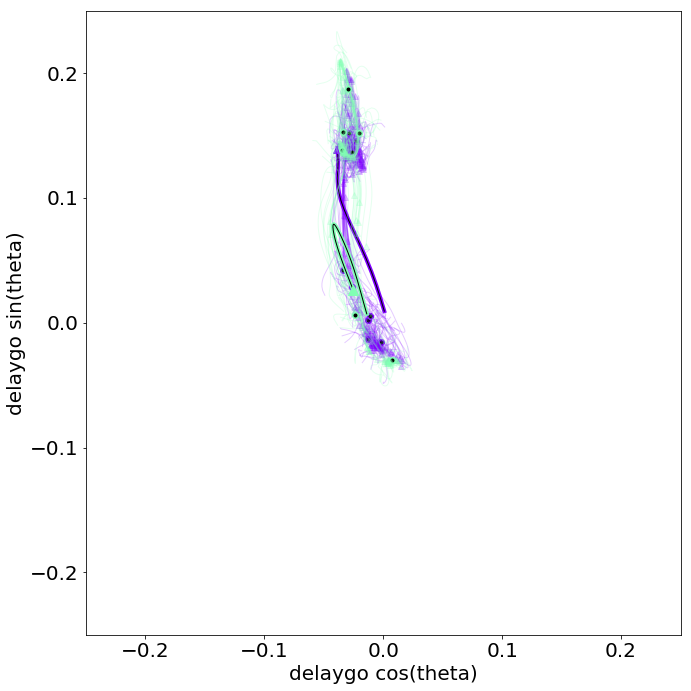

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2h00001/0/ckpts/model.ckpt-1372000


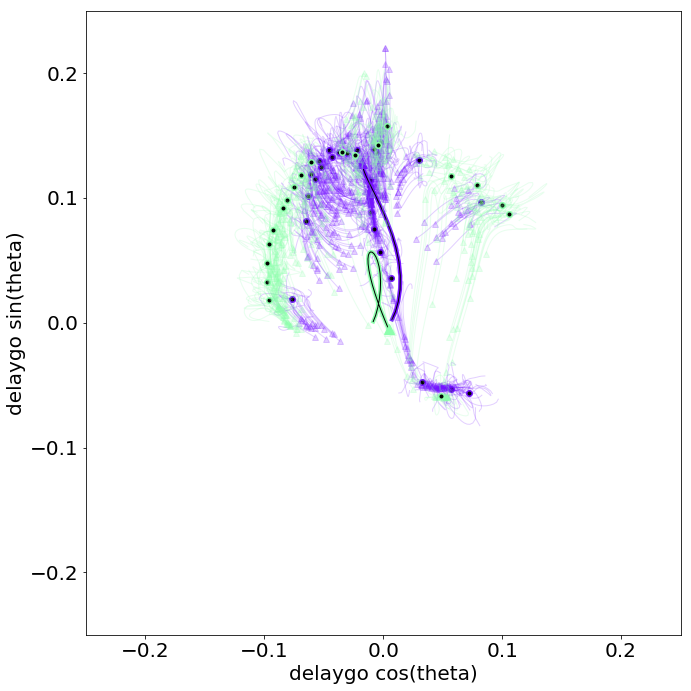

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2h00001/0/ckpts/model.ckpt-1372000


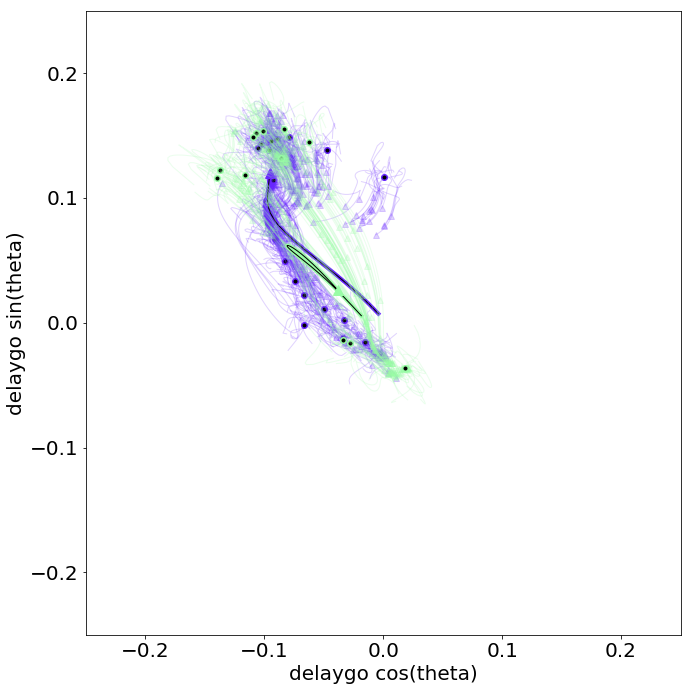

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2h00001/0/ckpts/model.ckpt-1372000


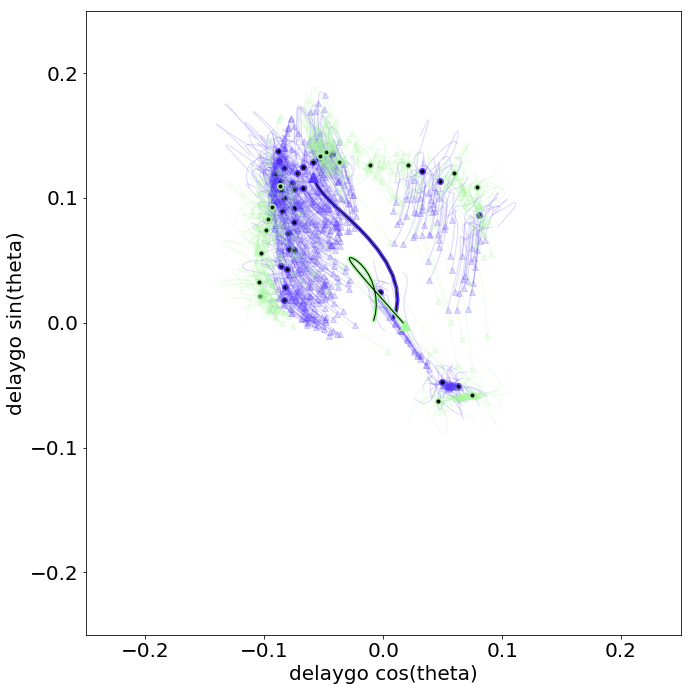

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2h00001/0/ckpts/model.ckpt-1372000


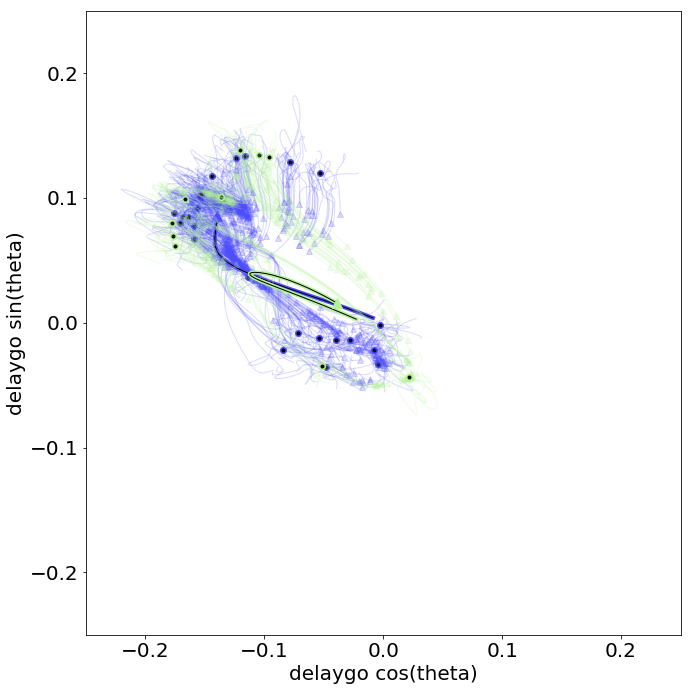

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2h00001/0/ckpts/model.ckpt-1372000


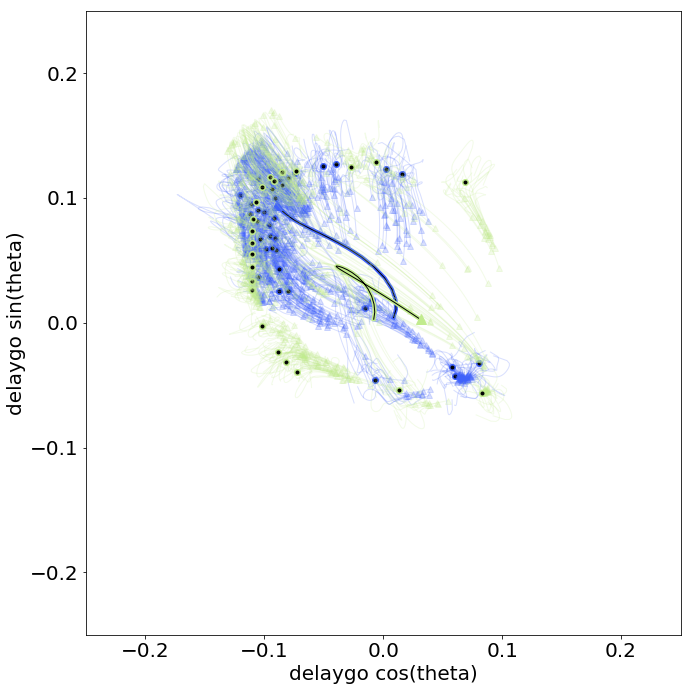

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2h00001/0/ckpts/model.ckpt-1372000


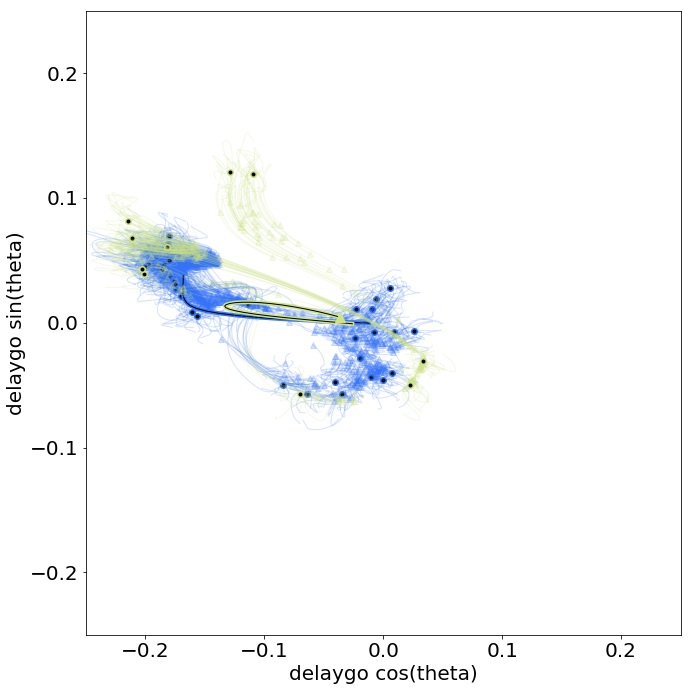

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2h00001/0/ckpts/model.ckpt-1372000


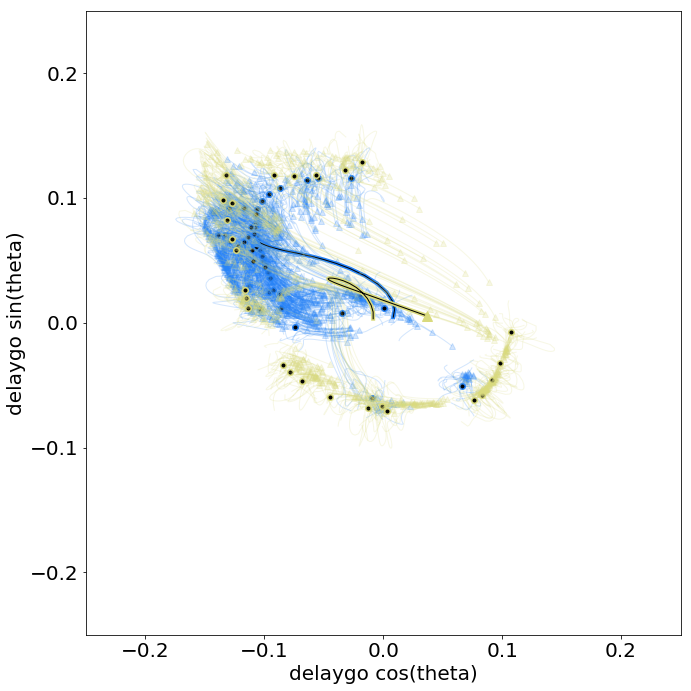

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2h00001/0/ckpts/model.ckpt-1372000


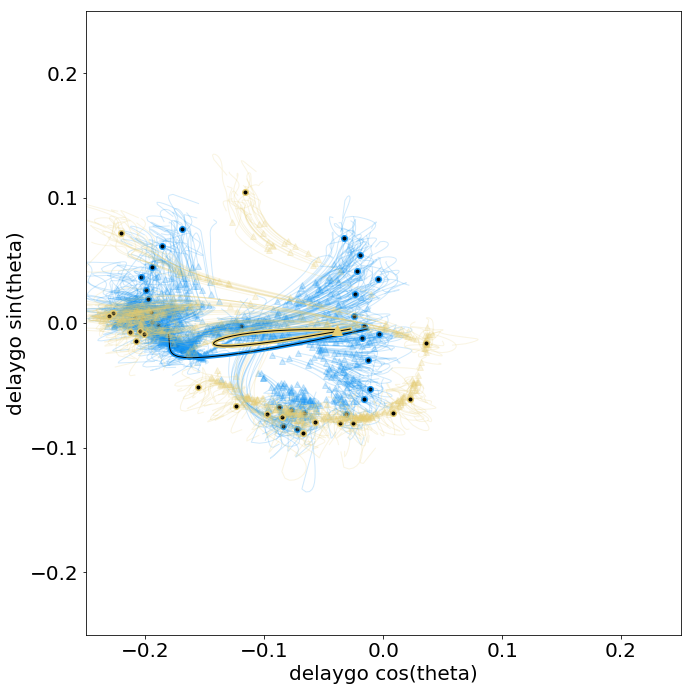

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2h00001/0/ckpts/model.ckpt-1372000


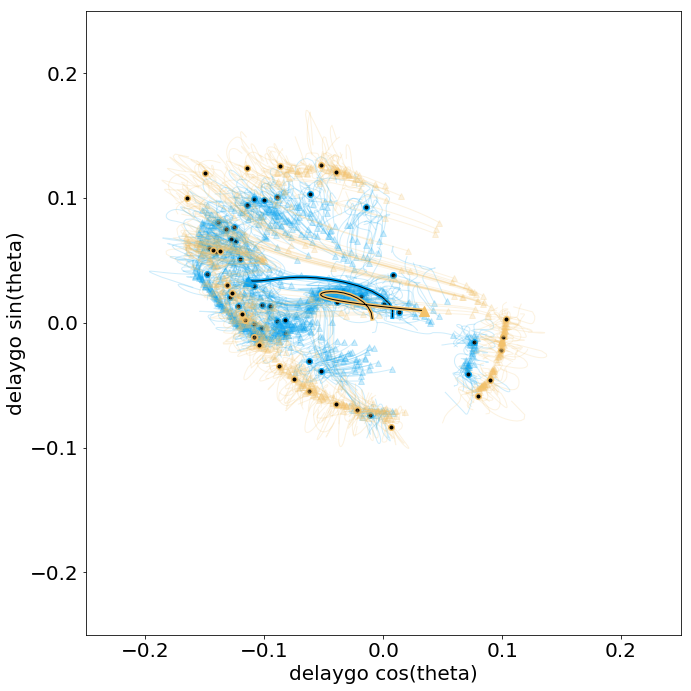

In [190]:
cmap=plt.get_cmap('rainbow')
ut = -9
axis_rule = 'delaygo'

D = make_axes(model_dir_all,ckpt_n_dir,axis_rule)
model = Model(model_dir_all)
with tf.Session() as sess:
    model.saver.restore(sess,ckpt_n_dir)
    model._sigma=0
    hparams = model.hp
    trial = generate_trials(axis_rule, hparams, mode='test', noise_on=False, delay_fac =1)
    feed_dict = tools.gen_feed_dict(model, trial, hparams)
    h_tf = sess.run(model.h, feed_dict=feed_dict) #(n_time, n_condition, n_neuron)

for s in range(10):
    fig = plt.figure(figsize=(10,10),tight_layout=True,facecolor='white')
    plot_fp_jitter(model_dir_all,'delaygo',s,ut,D,vanilla_run_at_fp,c=cmap((s)/40),rand_step_coef=.01,n_bumps = 20, h_tf = h_tf, trial = trial)
    plot_fp_jitter(model_dir_all,'delayanti',s,ut,D,vanilla_run_at_fp,c=cmap((s+20)/40),rand_step_coef=.01,n_bumps = 20)
    
    plt.ylabel(axis_rule + ' sin(theta)')
    plt.xlabel(axis_rule + ' cos(theta)')
    plt.show()

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2h00001/0/ckpts/model.ckpt-1372000
Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2h00001/0/ckpts/model.ckpt-1372000


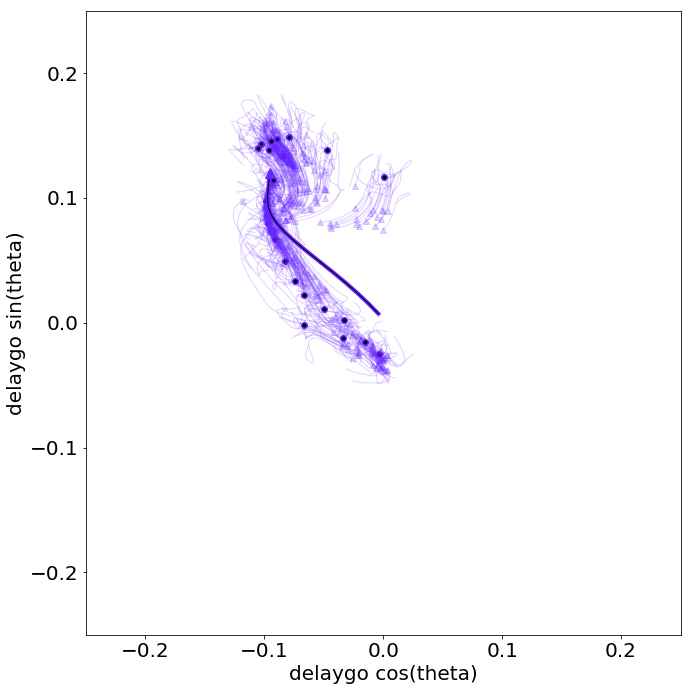

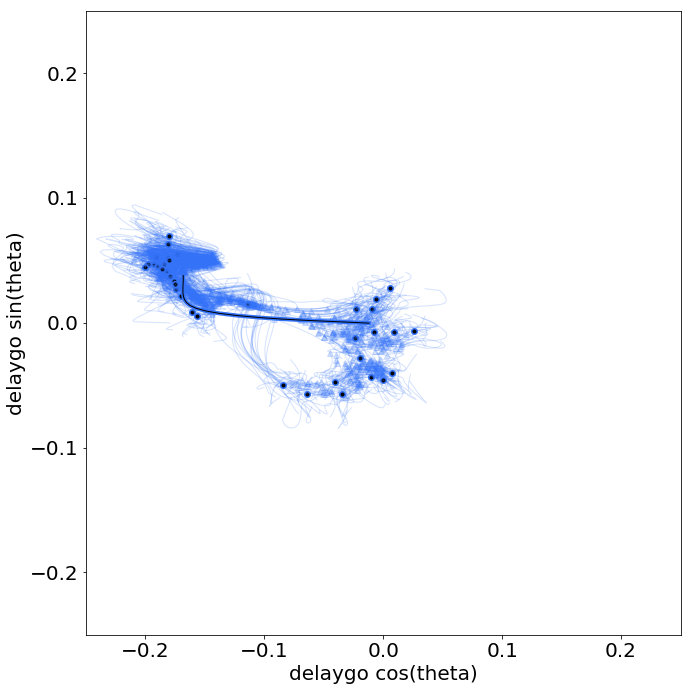

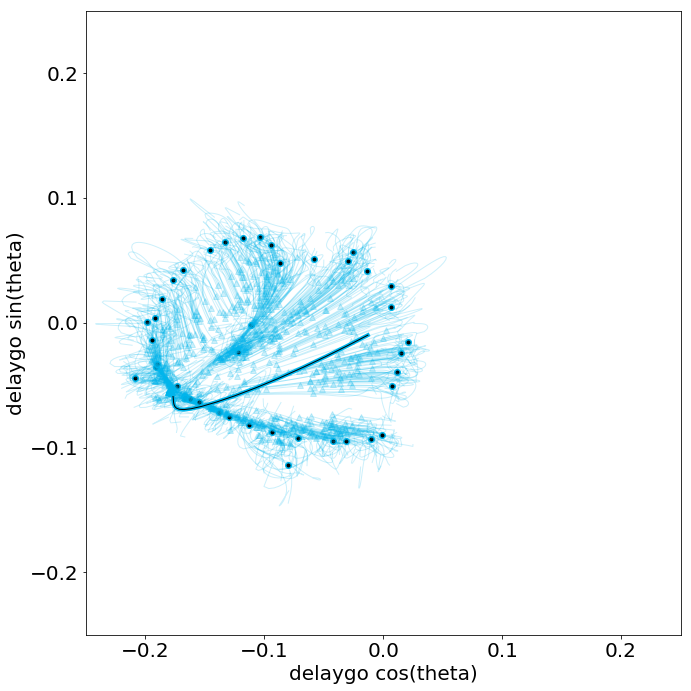

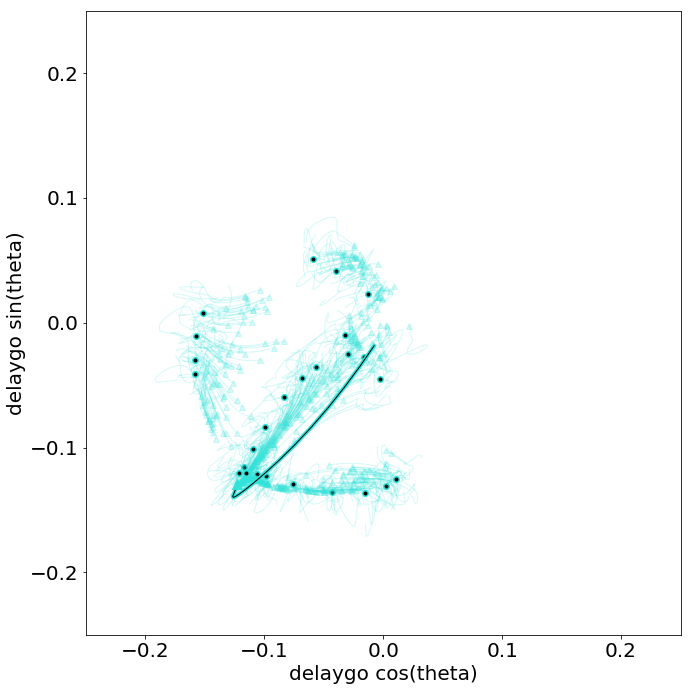

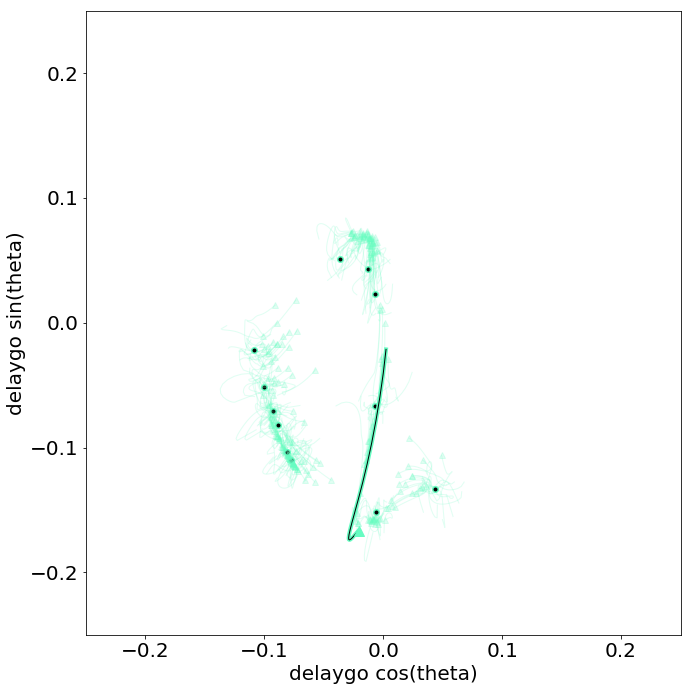

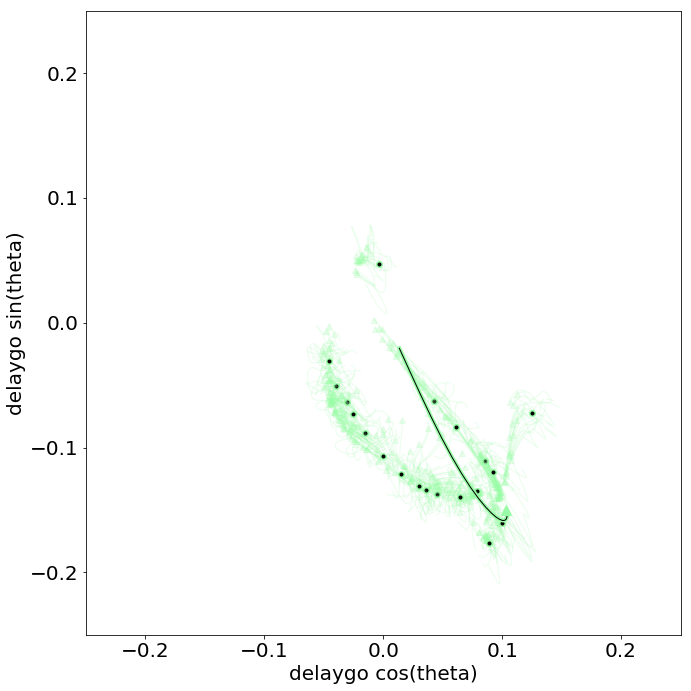

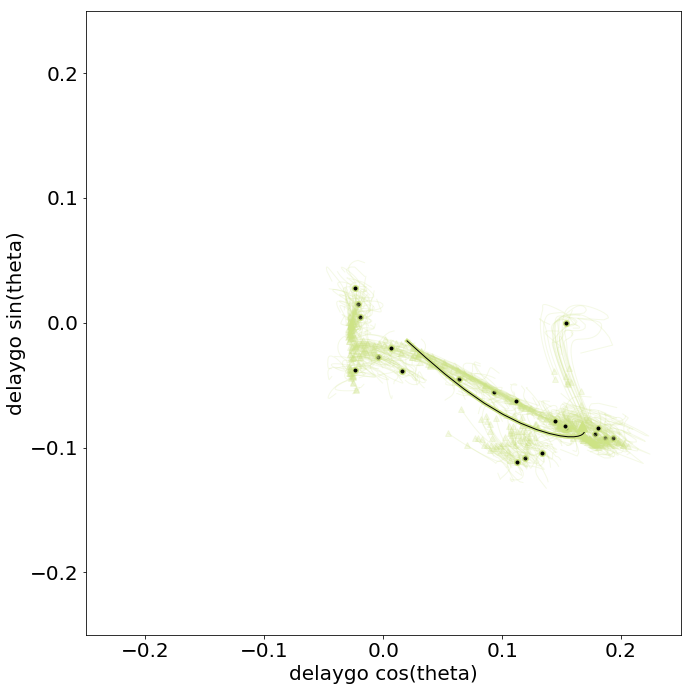

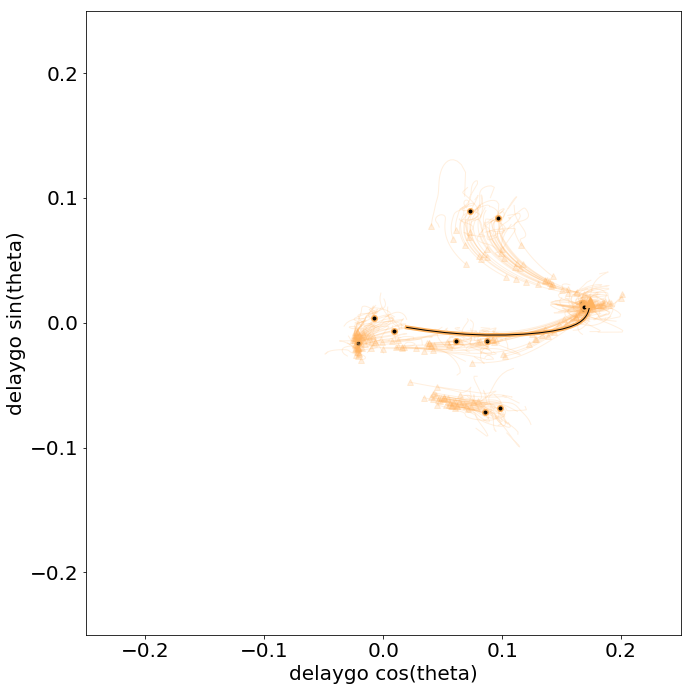

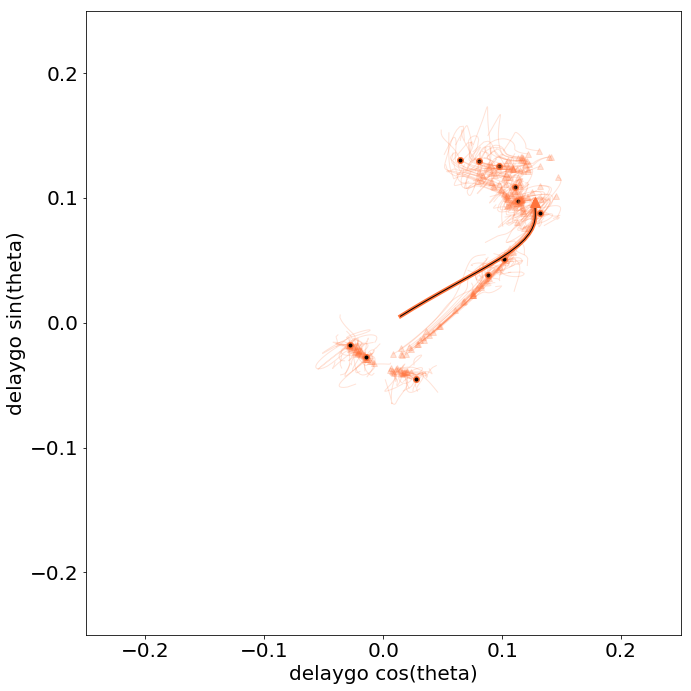

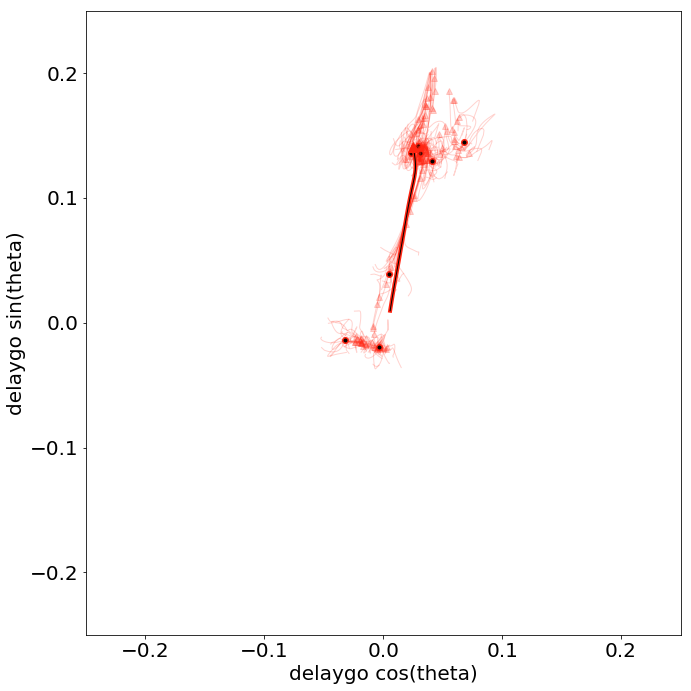

In [192]:
cmap=plt.get_cmap('rainbow')
ut = -9
axis_rule = 'delaygo'

D = make_axes(model_dir_all,ckpt_n_dir,axis_rule)
model = Model(model_dir_all)
with tf.Session() as sess:
    model.saver.restore(sess,ckpt_n_dir)
    model._sigma=0
    hparams = model.hp
    trial = generate_trials(axis_rule, hparams, mode='test', noise_on=False, delay_fac =1)
    feed_dict = tools.gen_feed_dict(model, trial, hparams)
    h_tf = sess.run(model.h, feed_dict=feed_dict) #(n_time, n_condition, n_neuron)

for s in range(2,40,4):
    fig = plt.figure(figsize=(10,10),tight_layout=True,facecolor='white')
    plot_fp_jitter(model_dir_all,'delaygo',s,ut,D,vanilla_run_at_fp,c=cmap(s/40),rand_step_coef=.01,n_bumps = 20, h_tf = h_tf, trial = trial)

    plt.ylabel(axis_rule + ' sin(theta)')
    plt.xlabel(axis_rule + ' cos(theta)')
plt.show()

1.62085e-11


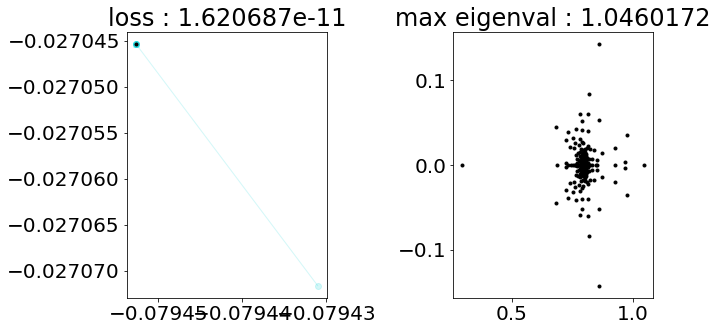

3.374728e-11


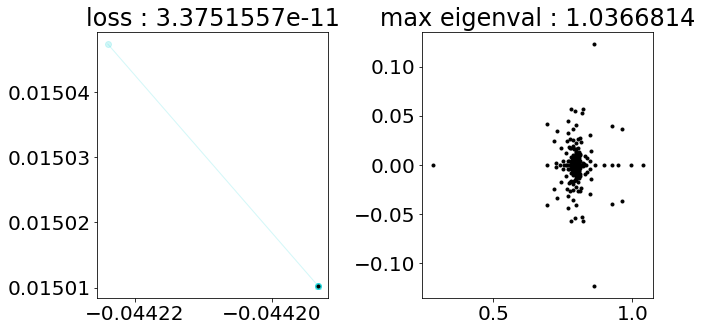

5.434861e-11


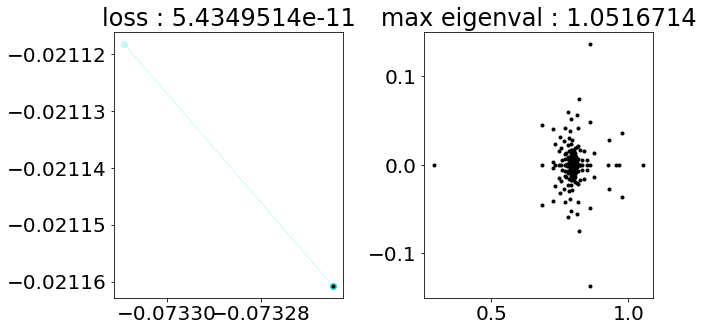

5.491773e-11


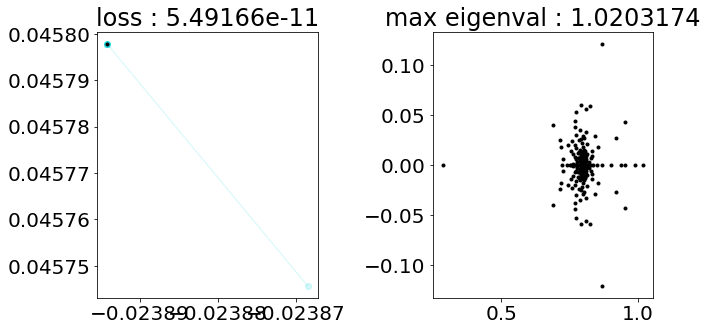

1.279182e-10


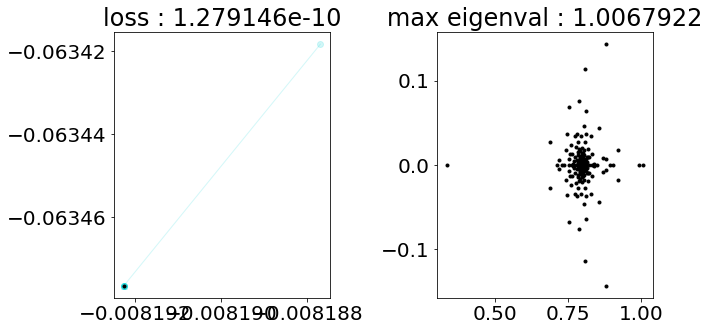

1.4633054e-10


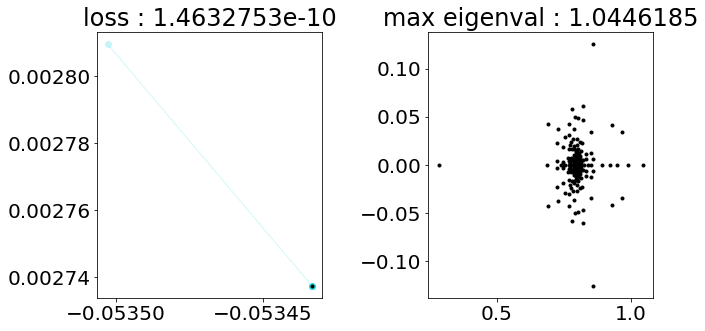

1.493042e-10


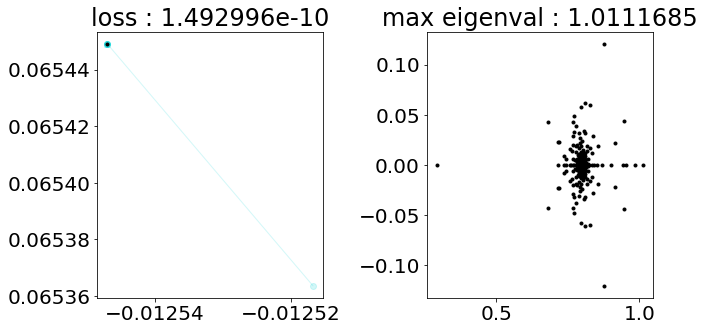

2.0465049e-10


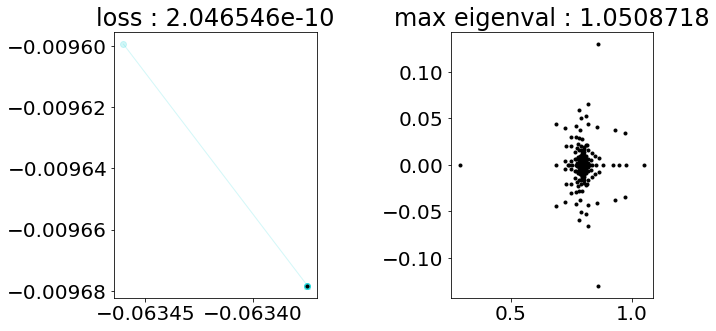

2.0880409e-10


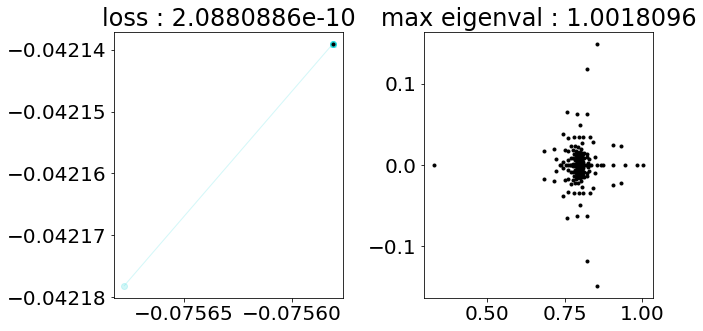

2.1699378e-10


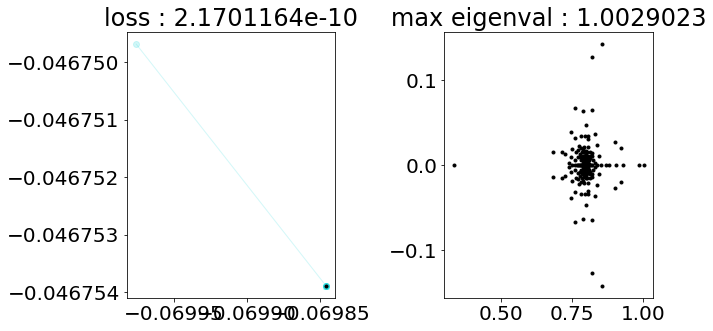

2.5031432e-10


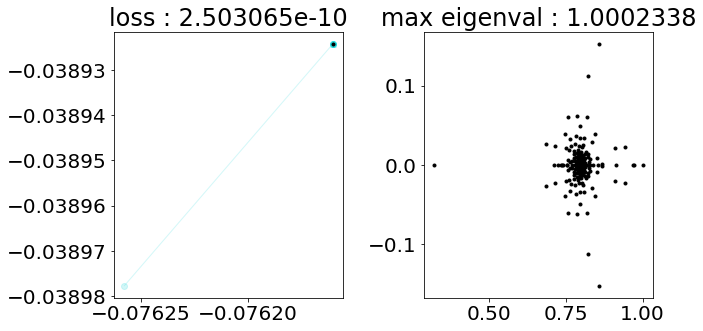

2.5690286e-10


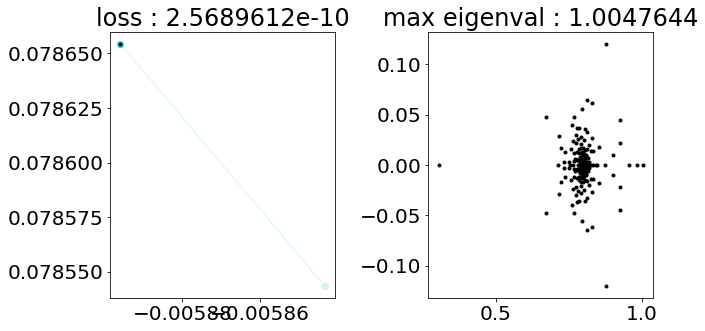

3.4252412e-10


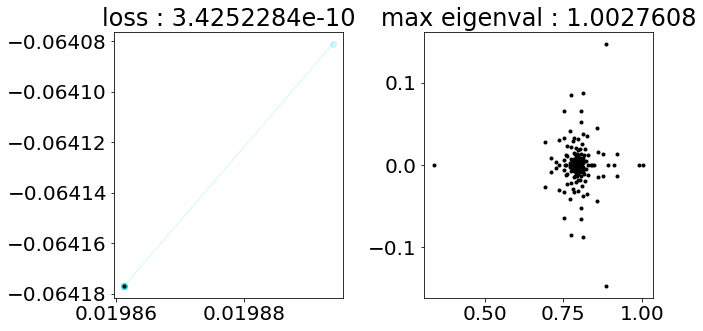

3.5498732e-10


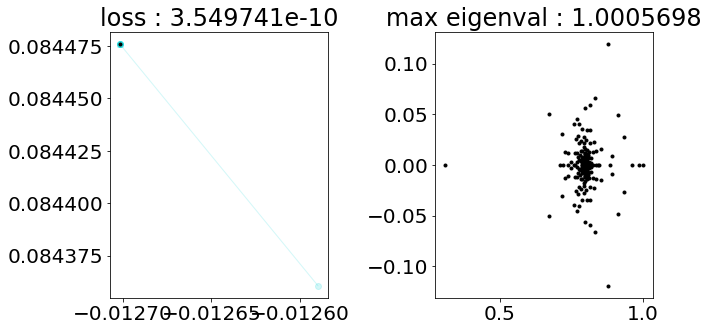

4.5361365e-10


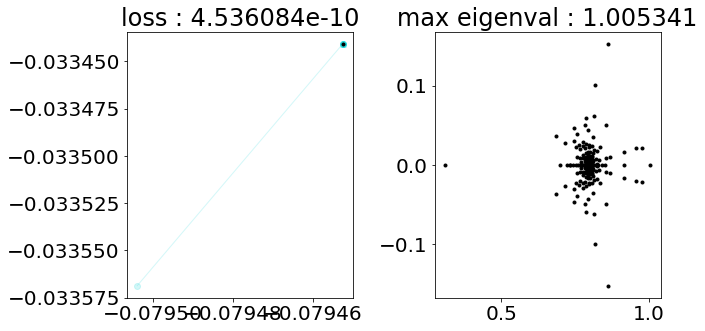

4.6206203e-10


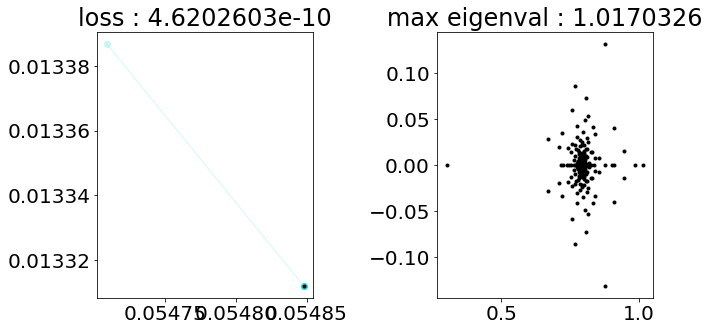

4.79351e-10


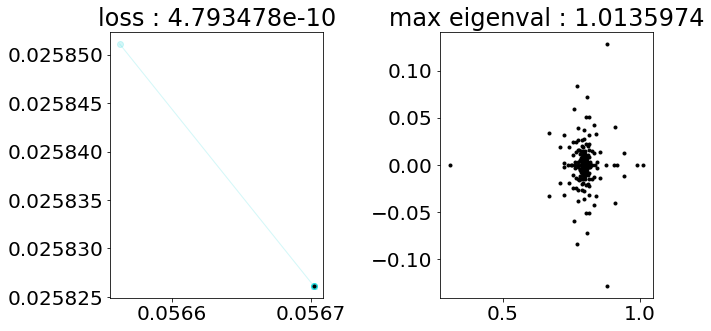

5.0037186e-10


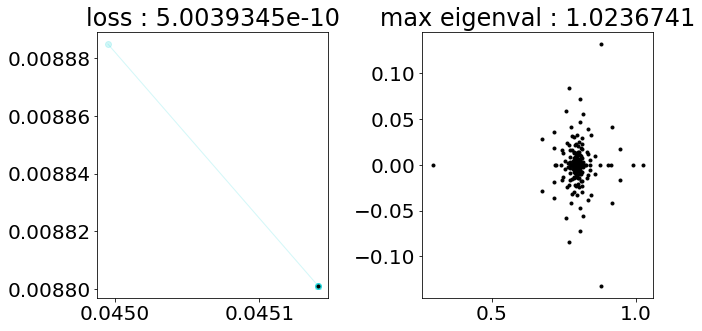

5.550321e-10


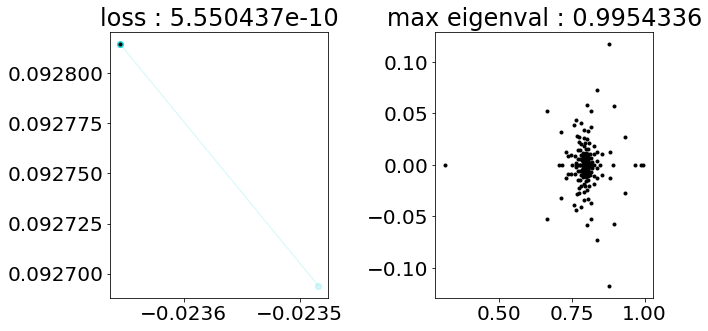

6.672939e-10


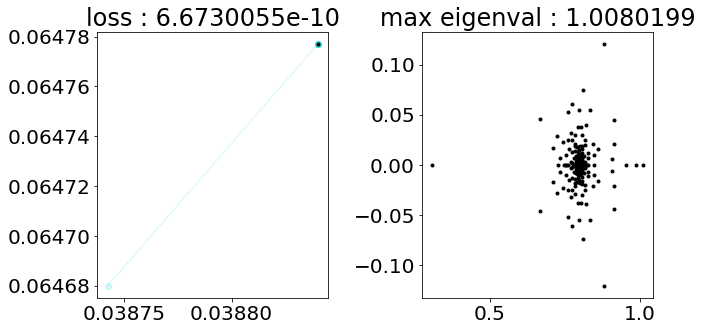

7.0965744e-10


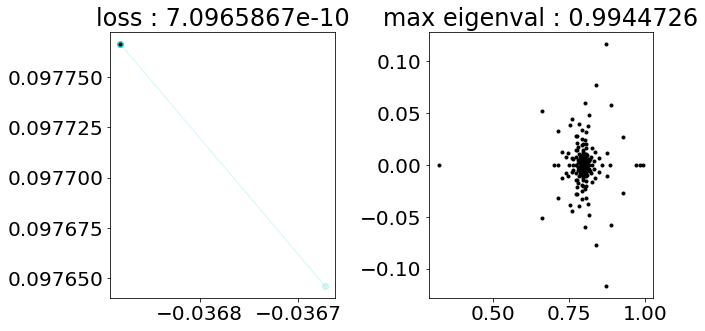

7.36818e-10


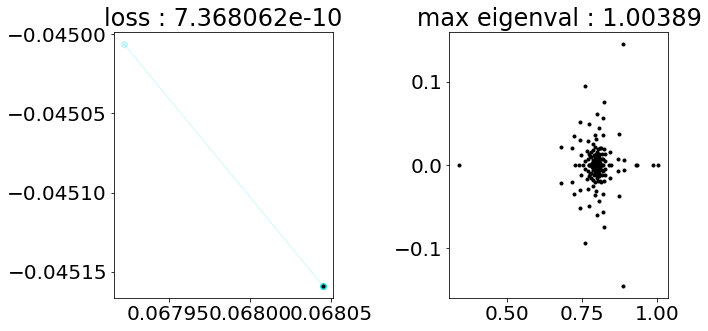

8.380795e-10


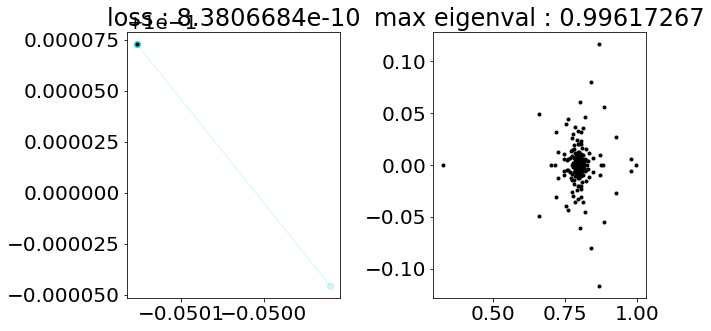

In [160]:
rule = 'delaygo'
s = 13
ut = -9
plot_1fp_jitter(model_dir_all,rule,s,ut,D,vanilla_run_at_fp,n_steps = 1,rand_step_coef=0,n_bumps = 1)
    

In [53]:
fldr = os.path.join(model_dir_all,'fps',rule)
filename = fldr +'/'+ fp_epoch + '_' +  str(ut) + '_' + str(s)+'.npz'
load_all_fps = np.load(filename)

x_star = trial.x[T[1],s,:]
rnn_fun = lambda h : rnn_vanilla(params, h, x_star, alpha)
batch_rnn_fun = vmap(rnn_fun, in_axes=(0,))
loss_fun = lambda h : np.mean((h - batch_rnn_fun(h))**2, axis=1)

In [54]:
h = load_all_fps['fps'][0]
h_new = rnn_vanilla(params, h, x_star, alpha)

In [57]:
load_all_fps['losses']

array([4.5319034e-14, 1.2924721e-11, 1.4437594e-11, 2.5860848e-11,
       7.3795928e-11, 9.3929517e-11, 9.4797059e-11, 1.0939865e-10,
       1.1329106e-10, 1.2261447e-10, 1.3642582e-10, 1.3815382e-10,
       1.3832263e-10, 1.4040963e-10, 1.4935916e-10, 1.6117098e-10,
       1.7757593e-10, 1.7869922e-10, 1.7900989e-10, 2.1195734e-10,
       3.4485254e-10, 3.6390929e-10, 3.7793080e-10, 3.7816111e-10,
       3.8449546e-10, 4.0907833e-10, 4.5983561e-10, 4.6619025e-10,
       5.8571603e-10, 6.1760691e-10, 6.6821637e-10, 6.9336464e-10,
       7.4412748e-10, 7.4504514e-10, 7.4766032e-10, 8.4726826e-10,
       8.9785340e-10], dtype=float32)

In [56]:
loss_fun(load_all_fps['fps'])

DeviceArray([3.2122816e-07, 3.3879917e-07, 4.7506322e-07, 3.1494022e-07,
             3.0923701e-07, 4.7202559e-07, 4.7594185e-07, 2.8663200e-07,
             5.2242365e-07, 3.2553515e-07, 4.6343868e-07, 4.8359493e-07,
             4.5623804e-07, 3.0807217e-07, 4.4298656e-07, 3.3127810e-07,
             3.0961274e-07, 5.0004383e-07, 3.2416483e-07, 4.1021619e-07,
             3.1463469e-07, 3.3335940e-07, 4.4222440e-07, 4.6865614e-07,
             4.8317207e-07, 2.5394849e-07, 2.5472065e-07, 3.9127258e-07,
             5.7487068e-07, 4.3621466e-07, 5.7375348e-07, 3.8044544e-07,
             3.4384246e-07, 5.4181982e-07, 3.6993268e-07, 4.3496937e-07,
             3.5359886e-07], dtype=float32)

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2h00001/0/ckpts/model.ckpt-1372000


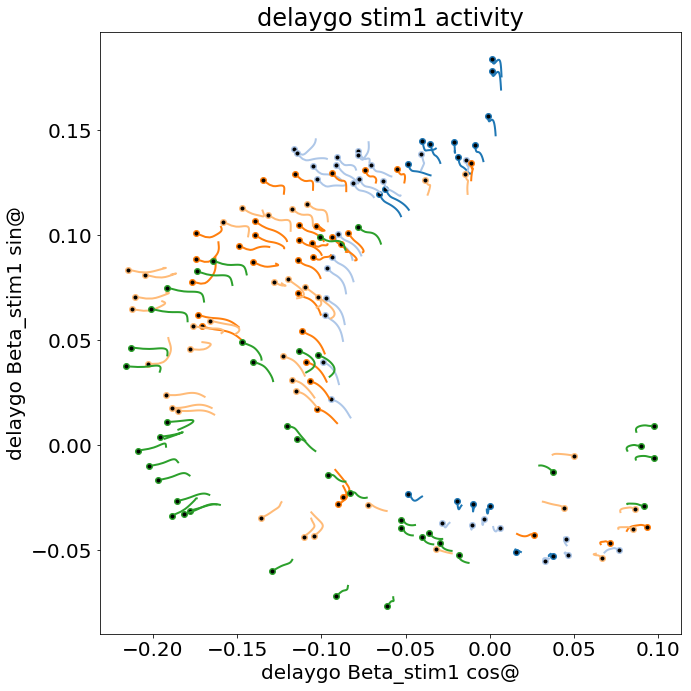

In [26]:
rule_master = 'delaygo'
rule = 'delaygo'

model = Model(model_dir_all)
with tf.Session() as sess:

    model.saver.restore(sess,ckpt_n_dir)
    # get all connection weights and biases as tensorflow variables
    var_list = model.var_list
    # evaluate the parameters after training
    params = [sess.run(var) for var in var_list]
    # get hparams
    hparams = model.hp
    trial_master = generate_trials(rule_master, hparams, mode = 'test', batch_size = 400, noise_on=False, delay_fac =1)
    feed_dict = tools.gen_feed_dict(model, trial_master, hparams)
    h_tf = sess.run(model.h, feed_dict=feed_dict) #(n_time, n_trials, n_neuron)
        
Beta_epoch = generate_Beta_epoch(h_tf,trial_master)
X_pca = Beta_epoch['stim1']    
D = np.concatenate((np.expand_dims(X_pca[:,0],axis=1),np.expand_dims(X_pca[:,1],axis=1)),axis = 1)
trial = generate_trials(rule, hparams, mode='test', noise_on=False, batch_size = 128, delay_fac =1)


fig = plt.figure(figsize=(10,10),tight_layout=True,facecolor='white')

num_trials = np.shape(trial.x)[1]
T = range(trial.epochs[fp_epoch][0],trial.epochs[fp_epoch][1]-1)

for s in range(10):#range(0,num_trials,4):
    filename = fldr +'/'+ fp_epoch + '_' +  str(-9) + '_' + str(s)+'.npz'
    load_all_fps = np.load(filename)
    
    x_star = trial.x[T,s,:]
    c = cmap(s/num_trials)

    for nfp in range(np.shape(load_all_fps['fps'])[0]):
        h0 = np.squeeze(load_all_fps['fps'][nfp,:])

        h_t = vanilla_run_at_fp(params, x_star, h0, alpha)

        X_trial = onp.dot(h_t,D)
        plt.plot(X_trial[:,0],X_trial[:,1],'-',c = c, linewidth = 2)

        X_trial = onp.dot(h0.T,D)
        plt.plot(X_trial[0],X_trial[1],'o',c = c, linewidth = 2)
        plt.plot(X_trial[0],X_trial[1],'.k', linewidth = 2)
        
plt.xlabel(rule_master + ' Beta_' + fp_epoch + ' cos@')
plt.ylabel(rule_master + ' Beta_' + fp_epoch + ' sin@') 
plt.title(rule + ' '+ fp_epoch+' activity')    
plt.show()

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2h00001/0/ckpts/model.ckpt-1372000


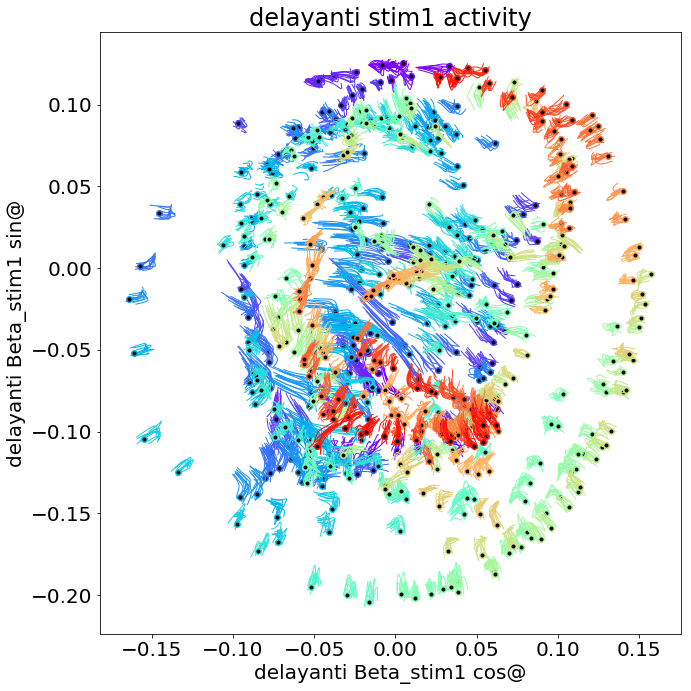

In [247]:
rule_master = 'delayanti'
rule = 'delayanti'
rand_step_coef = .002

model = Model(model_dir_all)
with tf.Session() as sess:

    model.saver.restore(sess,ckpt_n_dir)
    # get all connection weights and biases as tensorflow variables
    var_list = model.var_list
    # evaluate the parameters after training
    params = [sess.run(var) for var in var_list]
    # get hparams
    hparams = model.hp
    trial_master = generate_trials(rule_master, hparams, mode = 'test', batch_size = 400, noise_on=False, delay_fac =1)
    feed_dict = tools.gen_feed_dict(model, trial_master, hparams)
    h_tf = sess.run(model.h, feed_dict=feed_dict) #(n_time, n_trials, n_neuron)
        
Beta_epoch = generate_Beta_epoch(h_tf,trial_master)
X_pca = Beta_epoch['stim1']    
D = np.concatenate((np.expand_dims(X_pca[:,0],axis=1),np.expand_dims(X_pca[:,1],axis=1)),axis = 1)
trial = generate_trials(rule, hparams, mode='test', noise_on=False, batch_size = 128, delay_fac =1)
fig = plt.figure(figsize=(10,10),tight_layout=True,facecolor='white')

num_trials = np.shape(trial.x)[1]
T = range(trial.epochs[fp_epoch][0],trial.epochs[fp_epoch][1]-1)
N = np.shape(params[0])[1]

for s in range(num_trials):
    filename = fldr +'/'+ fp_epoch + '_' +  str(-9) + '_' + str(s)+'.npz'
    load_all_fps = np.load(filename)
    
    x_star = trial.x[T,s,:]
    c = cmap(s/num_trials)

    for nfp in range(np.shape(load_all_fps['fps'])[0]):
        h0 = np.squeeze(load_all_fps['fps'][nfp,:])

        for bump_num in range(10):
            h = h0 + rand_step_coef*npr.randn(N)
            h_t = vanilla_run_at_fp(params, x_star, h, alpha)

            X_trial = onp.dot(h_t,D)
            plt.plot(X_trial[:,0],X_trial[:,1],'-',c = c, linewidth = 1)

        X_trial = onp.dot(h0.T,D)
        plt.plot(X_trial[0],X_trial[1],'o',c = c, linewidth = 2)
        plt.plot(X_trial[0],X_trial[1],'.k', linewidth = 2)
        
plt.xlabel(rule_master + ' Beta_' + fp_epoch + ' cos@')
plt.ylabel(rule_master + ' Beta_' + fp_epoch + ' sin@') 
plt.title(rule + ' '+ fp_epoch+' activity')    
plt.show()    
plt.show()

In [82]:
q = np.diff(h_t,n=1,axis = 0)
np.shape(h_t)

(25, 256)

In [87]:
np.asarray(h_t)

ValueError: All input arrays must have the same shape.

In [107]:
np.shape(h_t[2] - h_t[1])

(256, 1)

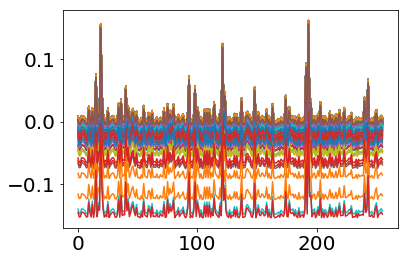

9.4685255e-09


In [110]:
# def q_step1(h_t):

plt.plot(h_t[1] - h_t[0])
plt.show()
print(load_all_fps['losses'][nfp])

before: 4.458055e-07 2.0595836e-10
before: 4.458055e-07 2.0595836e-10
before: 4.458055e-07 2.0595836e-10
before: 4.458055e-07 2.0595836e-10
before: 4.458055e-07 2.0595836e-10
before: 4.458055e-07 2.0595836e-10
before: 4.458055e-07 2.0595836e-10
before: 4.458055e-07 2.0595836e-10
before: 4.458055e-07 2.0595836e-10
before: 4.458055e-07 2.0595836e-10


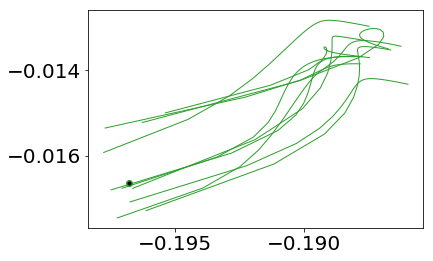

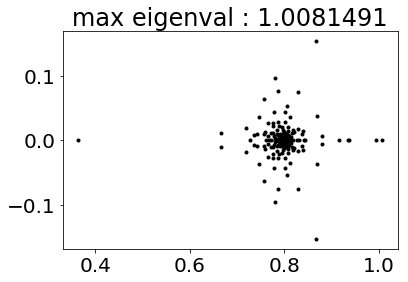

before: 4.104862e-07 2.8502686e-10
before: 4.104862e-07 2.8502686e-10
before: 4.104862e-07 2.8502686e-10
before: 4.104862e-07 2.8502686e-10
before: 4.104862e-07 2.8502686e-10
before: 4.104862e-07 2.8502686e-10
before: 4.104862e-07 2.8502686e-10
before: 4.104862e-07 2.8502686e-10
before: 4.104862e-07 2.8502686e-10
before: 4.104862e-07 2.8502686e-10


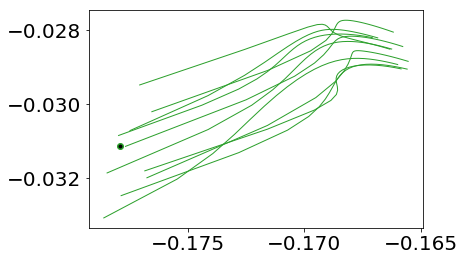

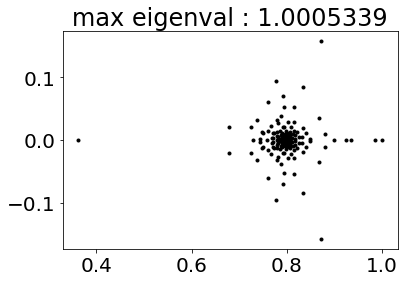

before: 4.0217589e-07 3.1863664e-10
before: 4.0217589e-07 3.1863664e-10
before: 4.0217589e-07 3.1863664e-10
before: 4.0217589e-07 3.1863664e-10
before: 4.0217589e-07 3.1863664e-10
before: 4.0217589e-07 3.1863664e-10
before: 4.0217589e-07 3.1863664e-10
before: 4.0217589e-07 3.1863664e-10
before: 4.0217589e-07 3.1863664e-10
before: 4.0217589e-07 3.1863664e-10


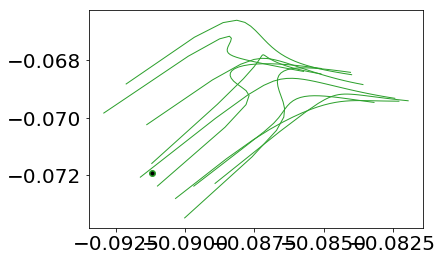

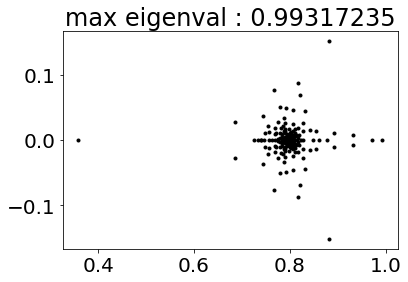

before: 4.1968912e-07 3.3921432e-10
before: 4.1968912e-07 3.3921432e-10
before: 4.1968912e-07 3.3921432e-10
before: 4.1968912e-07 3.3921432e-10
before: 4.1968912e-07 3.3921432e-10
before: 4.1968912e-07 3.3921432e-10
before: 4.1968912e-07 3.3921432e-10
before: 4.1968912e-07 3.3921432e-10
before: 4.1968912e-07 3.3921432e-10
before: 4.1968912e-07 3.3921432e-10


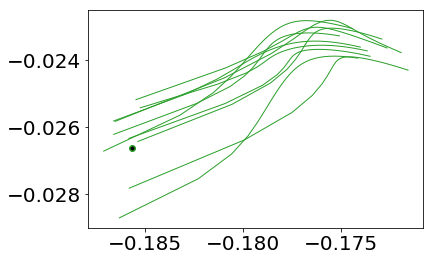

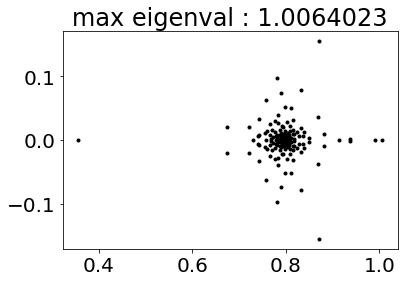

before: 3.8962781e-07 3.3990086e-10
before: 3.8962781e-07 3.3990086e-10
before: 3.8962781e-07 3.3990086e-10
before: 3.8962781e-07 3.3990086e-10
before: 3.8962781e-07 3.3990086e-10
before: 3.8962781e-07 3.3990086e-10
before: 3.8962781e-07 3.3990086e-10
before: 3.8962781e-07 3.3990086e-10
before: 3.8962781e-07 3.3990086e-10
before: 3.8962781e-07 3.3990086e-10


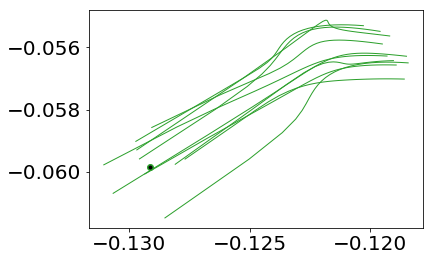

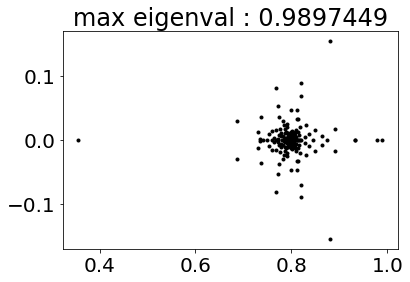

before: 5.513404e-07 3.9577844e-10
before: 5.513404e-07 3.9577844e-10
before: 5.513404e-07 3.9577844e-10
before: 5.513404e-07 3.9577844e-10
before: 5.513404e-07 3.9577844e-10
before: 5.513404e-07 3.9577844e-10
before: 5.513404e-07 3.9577844e-10
before: 5.513404e-07 3.9577844e-10
before: 5.513404e-07 3.9577844e-10
before: 5.513404e-07 3.9577844e-10


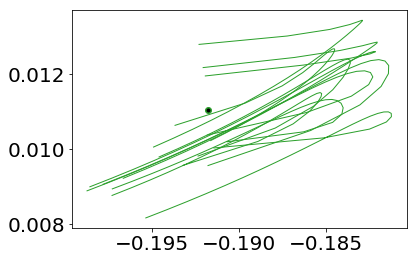

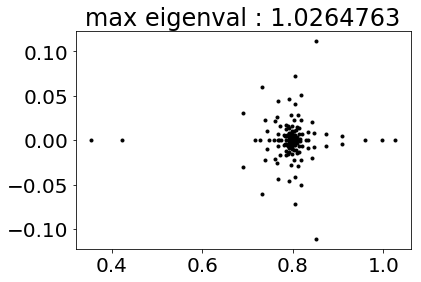

before: 4.5952092e-07 4.059449e-10
before: 4.5952092e-07 4.059449e-10
before: 4.5952092e-07 4.059449e-10
before: 4.5952092e-07 4.059449e-10
before: 4.5952092e-07 4.059449e-10
before: 4.5952092e-07 4.059449e-10
before: 4.5952092e-07 4.059449e-10
before: 4.5952092e-07 4.059449e-10
before: 4.5952092e-07 4.059449e-10
before: 4.5952092e-07 4.059449e-10


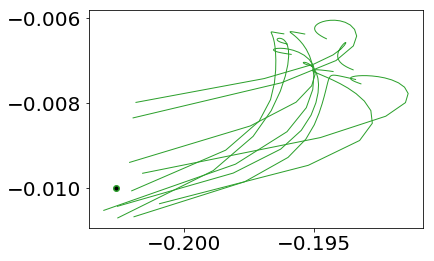

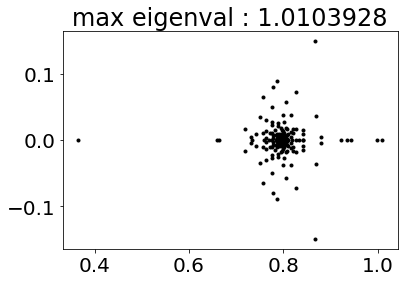

before: 4.88048e-07 5.773178e-10
before: 4.88048e-07 5.773178e-10
before: 4.88048e-07 5.773178e-10
before: 4.88048e-07 5.773178e-10
before: 4.88048e-07 5.773178e-10
before: 4.88048e-07 5.773178e-10
before: 4.88048e-07 5.773178e-10
before: 4.88048e-07 5.773178e-10
before: 4.88048e-07 5.773178e-10
before: 4.88048e-07 5.773178e-10


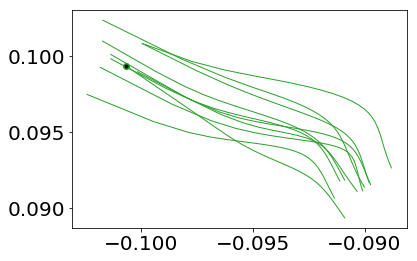

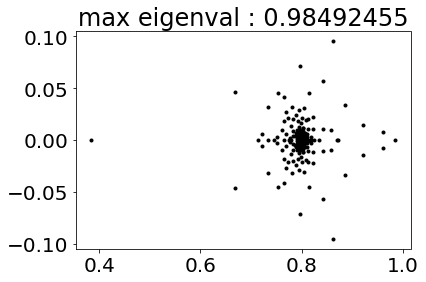

before: 4.6081126e-07 5.9057753e-10
before: 4.6081126e-07 5.9057753e-10
before: 4.6081126e-07 5.9057753e-10
before: 4.6081126e-07 5.9057753e-10
before: 4.6081126e-07 5.9057753e-10
before: 4.6081126e-07 5.9057753e-10
before: 4.6081126e-07 5.9057753e-10
before: 4.6081126e-07 5.9057753e-10
before: 4.6081126e-07 5.9057753e-10
before: 4.6081126e-07 5.9057753e-10


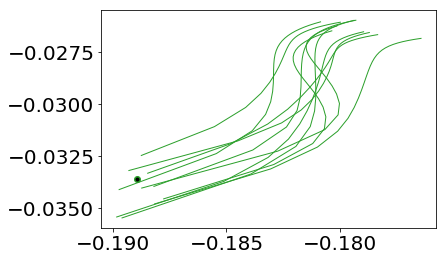

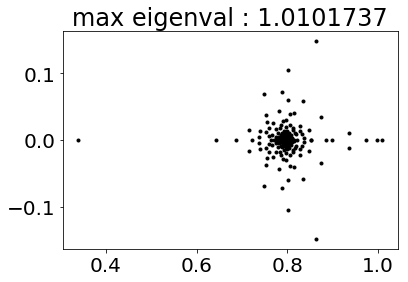

before: 5.5629016e-07 6.027132e-10
before: 5.5629016e-07 6.027132e-10
before: 5.5629016e-07 6.027132e-10
before: 5.5629016e-07 6.027132e-10
before: 5.5629016e-07 6.027132e-10
before: 5.5629016e-07 6.027132e-10
before: 5.5629016e-07 6.027132e-10
before: 5.5629016e-07 6.027132e-10
before: 5.5629016e-07 6.027132e-10
before: 5.5629016e-07 6.027132e-10


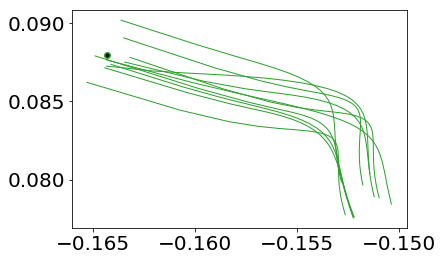

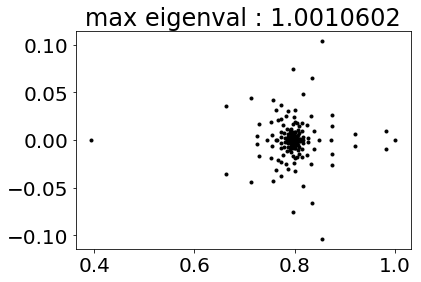

before: 5.409068e-07 6.058357e-10
before: 5.409068e-07 6.058357e-10
before: 5.409068e-07 6.058357e-10
before: 5.409068e-07 6.058357e-10
before: 5.409068e-07 6.058357e-10
before: 5.409068e-07 6.058357e-10
before: 5.409068e-07 6.058357e-10
before: 5.409068e-07 6.058357e-10
before: 5.409068e-07 6.058357e-10
before: 5.409068e-07 6.058357e-10


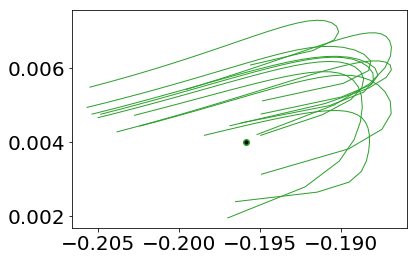

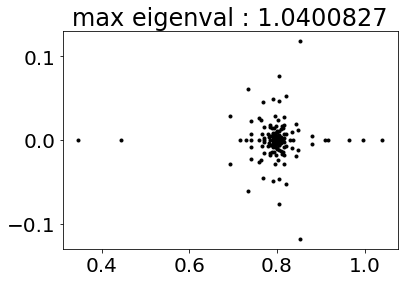

before: 4.2291123e-07 6.199845e-10
before: 4.2291123e-07 6.199845e-10
before: 4.2291123e-07 6.199845e-10
before: 4.2291123e-07 6.199845e-10
before: 4.2291123e-07 6.199845e-10
before: 4.2291123e-07 6.199845e-10
before: 4.2291123e-07 6.199845e-10
before: 4.2291123e-07 6.199845e-10
before: 4.2291123e-07 6.199845e-10
before: 4.2291123e-07 6.199845e-10


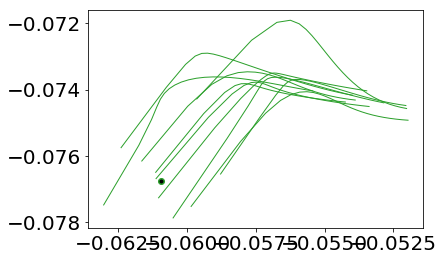

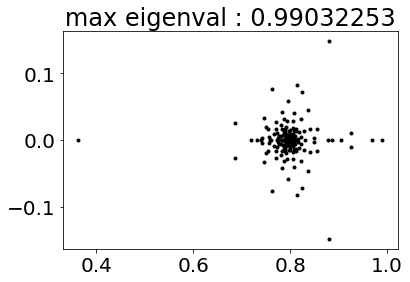

before: 6.190329e-07 6.6154265e-10
before: 6.190329e-07 6.6154265e-10
before: 6.190329e-07 6.6154265e-10
before: 6.190329e-07 6.6154265e-10
before: 6.190329e-07 6.6154265e-10
before: 6.190329e-07 6.6154265e-10
before: 6.190329e-07 6.6154265e-10
before: 6.190329e-07 6.6154265e-10
before: 6.190329e-07 6.6154265e-10
before: 6.190329e-07 6.6154265e-10


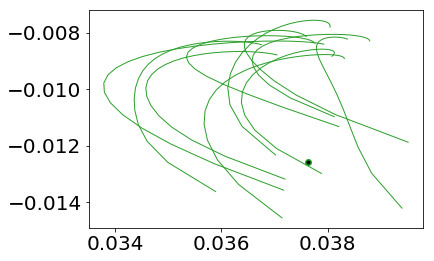

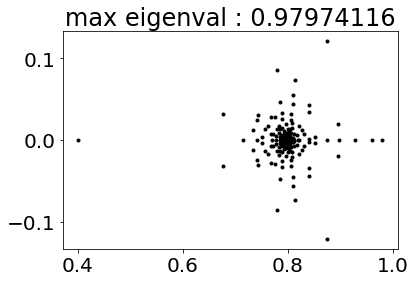

before: 4.177296e-07 7.0204115e-10
before: 4.177296e-07 7.0204115e-10
before: 4.177296e-07 7.0204115e-10
before: 4.177296e-07 7.0204115e-10
before: 4.177296e-07 7.0204115e-10
before: 4.177296e-07 7.0204115e-10
before: 4.177296e-07 7.0204115e-10
before: 4.177296e-07 7.0204115e-10
before: 4.177296e-07 7.0204115e-10
before: 4.177296e-07 7.0204115e-10


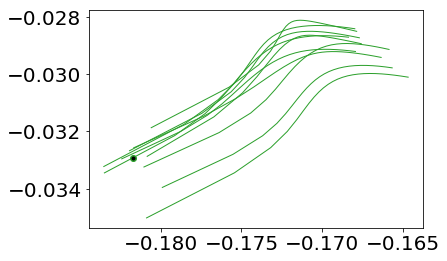

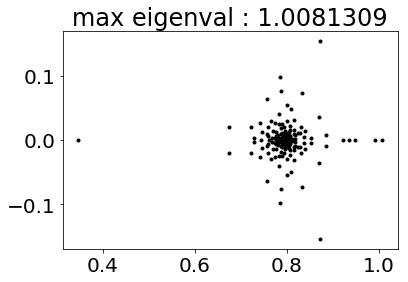

before: 5.517946e-07 7.5943263e-10
before: 5.517946e-07 7.5943263e-10
before: 5.517946e-07 7.5943263e-10
before: 5.517946e-07 7.5943263e-10
before: 5.517946e-07 7.5943263e-10
before: 5.517946e-07 7.5943263e-10
before: 5.517946e-07 7.5943263e-10
before: 5.517946e-07 7.5943263e-10
before: 5.517946e-07 7.5943263e-10
before: 5.517946e-07 7.5943263e-10


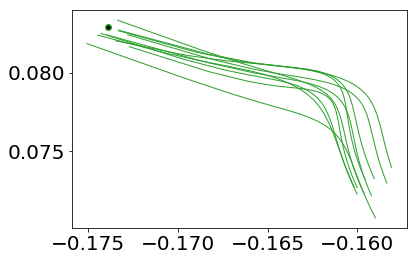

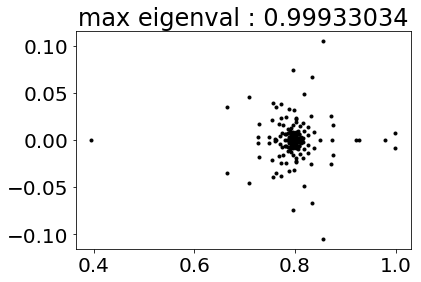

before: 5.6260075e-07 7.6210865e-10
before: 5.6260075e-07 7.6210865e-10
before: 5.6260075e-07 7.6210865e-10
before: 5.6260075e-07 7.6210865e-10
before: 5.6260075e-07 7.6210865e-10
before: 5.6260075e-07 7.6210865e-10
before: 5.6260075e-07 7.6210865e-10
before: 5.6260075e-07 7.6210865e-10
before: 5.6260075e-07 7.6210865e-10
before: 5.6260075e-07 7.6210865e-10


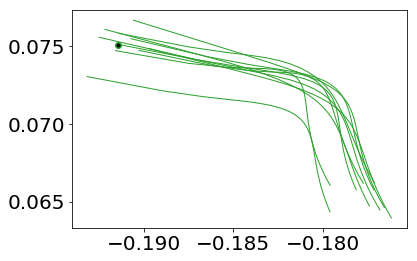

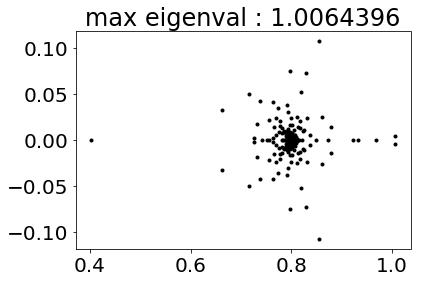

before: 5.5143295e-07 7.8841933e-10
before: 5.5143295e-07 7.8841933e-10
before: 5.5143295e-07 7.8841933e-10
before: 5.5143295e-07 7.8841933e-10
before: 5.5143295e-07 7.8841933e-10
before: 5.5143295e-07 7.8841933e-10
before: 5.5143295e-07 7.8841933e-10
before: 5.5143295e-07 7.8841933e-10
before: 5.5143295e-07 7.8841933e-10
before: 5.5143295e-07 7.8841933e-10


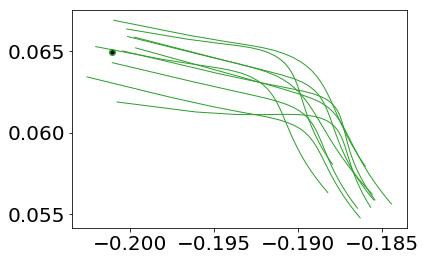

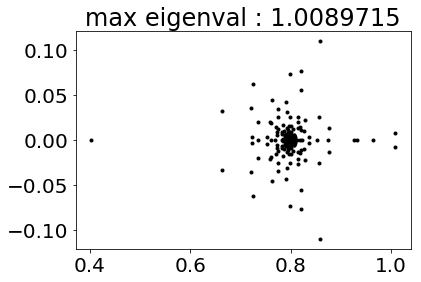

before: 5.290858e-07 7.925599e-10
before: 5.290858e-07 7.925599e-10
before: 5.290858e-07 7.925599e-10
before: 5.290858e-07 7.925599e-10
before: 5.290858e-07 7.925599e-10
before: 5.290858e-07 7.925599e-10
before: 5.290858e-07 7.925599e-10
before: 5.290858e-07 7.925599e-10
before: 5.290858e-07 7.925599e-10
before: 5.290858e-07 7.925599e-10


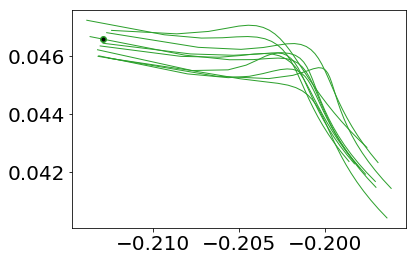

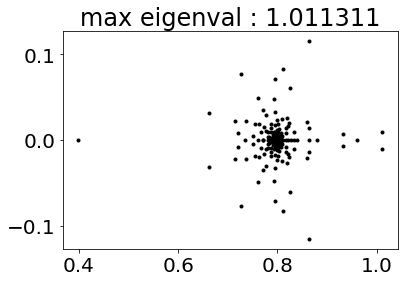

before: 4.7228968e-07 8.420992e-10
before: 4.7228968e-07 8.420992e-10
before: 4.7228968e-07 8.420992e-10
before: 4.7228968e-07 8.420992e-10
before: 4.7228968e-07 8.420992e-10
before: 4.7228968e-07 8.420992e-10
before: 4.7228968e-07 8.420992e-10
before: 4.7228968e-07 8.420992e-10
before: 4.7228968e-07 8.420992e-10
before: 4.7228968e-07 8.420992e-10


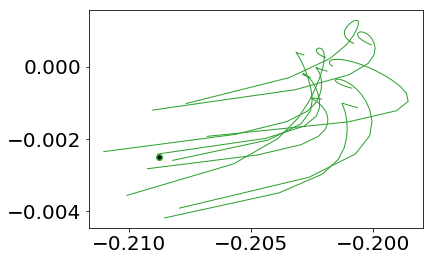

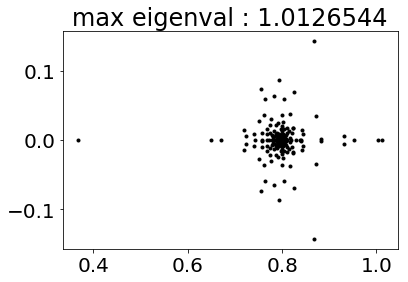

before: 5.213036e-07 8.5142704e-10
before: 5.213036e-07 8.5142704e-10
before: 5.213036e-07 8.5142704e-10
before: 5.213036e-07 8.5142704e-10
before: 5.213036e-07 8.5142704e-10
before: 5.213036e-07 8.5142704e-10
before: 5.213036e-07 8.5142704e-10
before: 5.213036e-07 8.5142704e-10
before: 5.213036e-07 8.5142704e-10
before: 5.213036e-07 8.5142704e-10


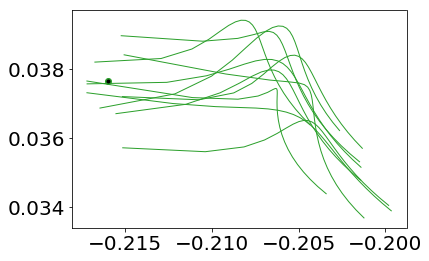

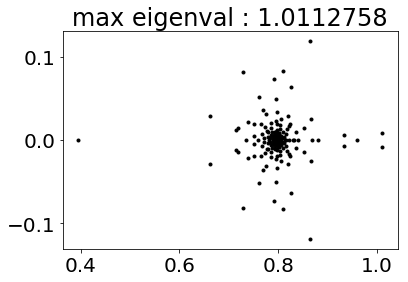

before: 4.817209e-07 9.050121e-10
before: 4.817209e-07 9.050121e-10
before: 4.817209e-07 9.050121e-10
before: 4.817209e-07 9.050121e-10
before: 4.817209e-07 9.050121e-10
before: 4.817209e-07 9.050121e-10
before: 4.817209e-07 9.050121e-10
before: 4.817209e-07 9.050121e-10
before: 4.817209e-07 9.050121e-10
before: 4.817209e-07 9.050121e-10


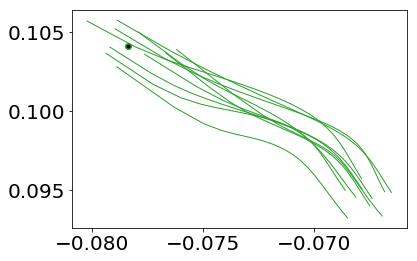

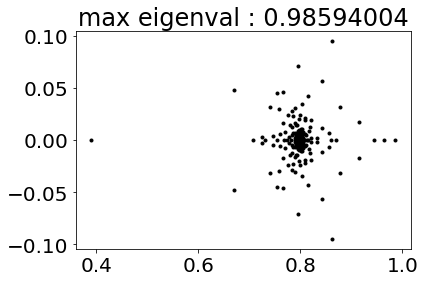

In [25]:
cmap=plt.get_cmap('tab20')
rand_step_coef = .001

trial = generate_trials('delayanti', hparams, mode='test', noise_on=False, batch_size = 128, delay_fac =1)
# Input during fixed point epoch
x_star = trial.x[trial.epochs[fp_epoch][1]-1,0,:]  

# Make a one parameter function of thie hidden state, useful for jacobians.
rnn_fun = lambda h : rnn_vanilla(params, h, x_star, alpha)
batch_rnn_fun = vmap(rnn_fun, in_axes=(0,))

s = 8
fp_epoch = 'stim1'

fldr = os.path.join(model_dir_all,'fps',rule)
filename = fldr +'/'+ fp_epoch + '_' +  str(-9) + '_' + str(s)+'.npz'
load_all_fps = np.load(filename)
sorted_fps, eig_decomps = eig_decomp(load_all_fps['fps'])

T = range(trial.epochs[fp_epoch][0],trial.epochs[fp_epoch][1]-1)
x_star = trial.x[T,s,:]
c = cmap(s/num_trials)

for nfp in range(np.shape(load_all_fps['fps'])[0]):
    h0 = np.squeeze(load_all_fps['fps'][nfp,:])

    for bump_num in range(10):
        h = h0 + rand_step_coef*npr.randn(N)
        h_t = vanilla_run_at_fp(params, x_star, h, alpha)
        
        h_new = rnn_vanilla(params, h0, x_star[0,:], alpha)
        print('before:',np.mean((h_new - h0)**2),load_all_fps['losses'][nfp])

        X_trial = onp.dot(h_t,D)
        plt.plot(X_trial[:,0],X_trial[:,1],'-',c = c, linewidth = 1)

    X_trial = onp.dot(h0.T,D)
    plt.plot(X_trial[0],X_trial[1],'o',c = c, linewidth = 2)
    plt.plot(X_trial[0],X_trial[1],'.k', linewidth = 2)
    plt.show()

    plt.plot(eig_decomps[nfp]['evals'].real,eig_decomps[nfp]['evals'].imag,'.k')
    plt.title('max eigenval : ' +str(np.max(eig_decomps[nfp]['evals'].real)))
    plt.show()



In [196]:
rule = 'delaygo'
fldr = os.path.join(model_dir_all,'golub_fixed_pts',rule)
fp_epoch = 'go1'
f = '_0.0'
filename = fldr +'/'+ fp_epoch + f + '.npy'
load_all_fps = np.load(filename)

In [199]:
print(load_all_fps)

{'qstar': array([2.71714498e-07, 2.72569309e-07, 3.26789291e-07, 3.26680180e-07,
       3.25066082e-07, 3.22543883e-07, 3.18086109e-07, 3.17809906e-07,
       3.16471215e-07, 3.14760342e-07, 3.20685444e-07, 3.19066288e-07,
       3.08584333e-07, 3.17474132e-07, 3.11685540e-07, 3.08267147e-07,
       2.96812289e-07, 2.94845620e-07, 3.18662785e-07, 3.37076528e-07,
       3.20169818e-07, 2.19390245e-07, 2.67549979e-07, 2.41679061e-07,
       2.40846362e-07, 2.64961756e-07, 2.45205911e-07, 2.47953494e-07,
       2.45882916e-07, 2.36549454e-07, 2.45060789e-07, 2.26247266e-07,
       2.32429755e-07, 2.37582299e-07, 2.17905807e-07, 2.43896608e-07,
       2.18845997e-07, 2.04882895e-07, 2.29713962e-07, 2.18467335e-07,
       2.88749106e-07, 2.89734288e-07, 3.09782507e-07, 3.08921955e-07,
       3.24911781e-07, 4.46116417e-07, 3.40873868e-07, 3.54110512e-07,
       3.61066327e-07, 3.69273266e-07, 3.83674148e-07, 3.98988732e-07,
       4.42851842e-07, 4.43002421e-07, 4.77052765e-07, 3.35737070e-

In [201]:
for epoch in trial.epochs.keys():
    print(epoch)

delay1
stim1
go1
fix1


NameError: name 'fp_tols' is not defined

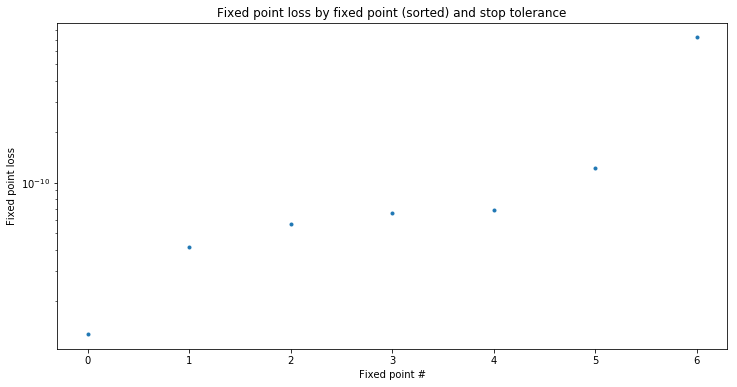

<Figure size 864x288 with 0 Axes>

In [21]:
f1 = plt.figure(figsize=(12,6))

plt.semilogy(load_all_fps['losses'],'.'); 
plt.xlabel('Fixed point #')
plt.ylabel('Fixed point loss');
plt.title('Fixed point loss by fixed point (sorted) and stop tolerance')

f2 = plt.figure(figsize=(12,4))

pidx = 1
nfp_tols = len(fp_tols)
for tol_idx, tol in enumerate(fp_tols):
    plt.subplot(1, nfp_tols, pidx); pidx += 1
    plt.hist(onp.log10(fp_loss_fun(all_fps[tol]['fps'])), 50);
    plt.xlabel('log10(FP loss)')
    plt.title('Tolerance: ' + str(tol));

In [269]:
load_all_fps['hps']

array({'opt_print_every': 100, 'adam_eps': 1e-05, 'adam_b1': 0.9, 'adam_b2': 0.999, 'unique_tol': 0.025, 'noise_var': 0.0001, 'decay_factor': 0.9999, 'decay_steps': 1, 'step_size': 0.5, 'fp_opt_stop_tol': 1e-09, 'num_batches': 10000, 'outlier_tol': 1.0, 'fp_tol': 1e-09},
      dtype=object)